 <center> <h1> <b> Pattern Recognition and Machine Learning (EE2802 - AI2000) </b> </h1> </center>

<b> Programming Assignment 02 - Regression : </b> Welcome to the programming assignment (PA) on regression. This programing assignment focuses on understanding the basic concepts of linear regression.


<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions are not accepted
3. Please DO NOT use any machine learning libraries unless and otherwise specified.


<center> <h2> <b> Understanding Basic Concepts </b> </h2> </center>


<b> Part - (1) :  Understanding Error Surfaces </b>

According to www.geogebra.org, the relationship between human height (in
inches) and weight (in pounds) is given by <br>
<centre> $ t = 3.86x - 110.42 $ </centre>

(a) Generate 25 meaningful data points from this relationship, mimicking a
noisy sensor, where the noise follows a zero mean Gaussian with a variance
of 20. Plot the scatter plot of the data. <br>
(b) Now, we need to estimate the above relationship from the noisy data
generated in (a) by fitting a line, i.e $\hat{t} = y(x,w) = w_{0} + w_{1}x$. Let us use least squares criterion discussed in the class to estimate the parameters $w_{0}$ and $w_{1}$. Generate and plot the error surface $J(w_{0},w_{1})$ associated with this approach. Locate the minimum on this error surface.<br>

(c) Estimate the parameters using least squares approach, and compare them
with the desired values.
<centre> $\textbf{w}_{opt} = (\textbf{X}^{T}\textbf{X})^{-1}\textbf{X}^{T}\textbf{t}$</centre>

(d) Report all your observations

<b> Part - (2) : Understanding model order and overfitting  </b>

(a). Generate  20  data  points  from $t_{n} = sin(2πx_{n}) + e_{n}$, where $x_{n} \in [0,1] $ and $e_{n} \thicksim \mathcal{N} (0,0.1)$ , and divide them into two sets, a training set and a testing set, with each set containing 10 points <br>

(b). Fit  an $M^{th}$ degree  polynomial  to  the  training  data  using  least  squares approach, i.e.,
 $\hat{t_{n}} = w_{0} + w_{1}x + .... +  w_{m}x^{m} + ... + w_{M}x^{M} $

Use the estimated parameter vector $\textbf{w}$, to predict the target values in training and testing datasets.  Plot the root mean squared error associated with each dataset, for M=0,1,...,9. Explain your results. <br>

(c) Increase the size of the training dataset to 100 points, and repeat (b). <br>

(d) Add a $l_{2}$ regularization term to the objective function in (b) and repeat (b) and (c).  Study the affect of Lagrange multiplier λ on the root mean squared error of the training and testing datasets <br>

(e) Modify the function in (a) to $t_{n}=5+sin(2πx_{n})+e_{n}$ to study the effect of regularizing the bias coefficient $w_{0}$.

(f) Report all your observations

<b> Part - (3) : Understanding the choice of kernel  </b>


(a). Generate 100 data points from $t_{n}=sin(2πx_{n})+e_{n}$, where $x_{n} \in [0 1]$ and $e_{n} \thicksim \mathcal{N}(0,0.1)$, and divide them into two sets, a training set and a testing test each containing 50 points.  Fit an $M^{th}$ degree polynomial using polynomial,Gaussian and sigmoidal kernels, and study the goodness of fit in each case, for different model orders M

(b). Repeat (a) by modifying the target function to <br>
 $t_{n} = $ $\begin{cases}
 \text{sinusoid} + e_{n} , \;\; where \;\; x  \in [0,1) \\
 \text{triangle} + e_{n} , \;\; where \;\; x  \in [1,2) \\
 \text{Gaussian} + e_{n} , \;\; where \;\; x  \in [2,3) \\
\end{cases}$

Clearly discuss your observations/results for each of the three kernels.

(c). Report all your observations

<b> Part - (4) : Understanding online training  </b>

(a). Repeat 3(a) and 3(b) using stochastic gradient descent for weight update.Study the effect of step size η on convergence of the weights, and compare them to those obtained using closed form expressions in 3.  Plot the mse as a  function  of  iterations.

(b). Study the effect of batch size on the speed of convergence

(c). Report all your observations

<b> Part - (5) : Understanding bias-variance trade-off  </b>

(a). Generate L=100 datasets of noisy sinusoidal data, each having N=25  datapoints. For each dataset, fit a $M=25^{th}$ order linear regression model consisting of 24 Gaussian basis functions and one bias parameter.  Use regularized least squares, governed by the parameter λ, to estimate the parameters $\textbf{w}$. Illustrate the concept of bias and variance using these 100 different parameter fits.
1.   Chose three different regularization coefficeints (low,middle and high)
2. For every regularization coefficient, produce two plots: one displaying 100 estimated curves, and the other showing the mean of the estimated curves alongside the original function.
2. For three regularization coefficients, you should have a total of six plots, meaning two plots for each regularization.
3. Using the six plots above, describe the bias-variance trade-off.


(b). Report all your observations







<b> Part - (6) : Understanding
Maximum a Posteriori (MAP) estimate  </b>

(a). Generate 100 noisy data points of a sinusoid. Fit a $20^{th}$  order  linear regression  model  with  Gaussian  basis  functions. Starting from a standard normal prior, update the statistics of the posterior density of the parameters using Bayesian sequential updates.

(b). Sample a parameter vector from the posterior distribution, and obtain the curve fit for this realization. Repeat this for several times, and estimate the average of these curve fits, and compare it with the original sinusoid

(c). Use the posterior distribution of the parameters to evaluate the predictive distribution of target $p(t_{0}/x_{0},X,t)$, and plot it for different number of training data points, as discussed in the class.

(d). Report all your observations

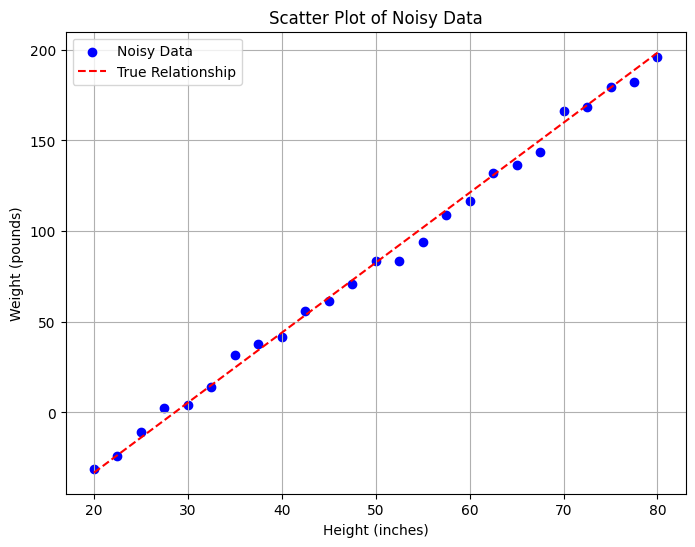

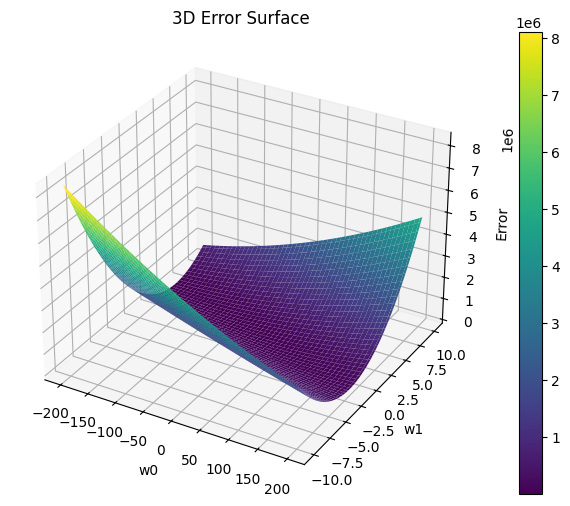

Minimum error at w0 = -103.0303, w1 = 3.7374


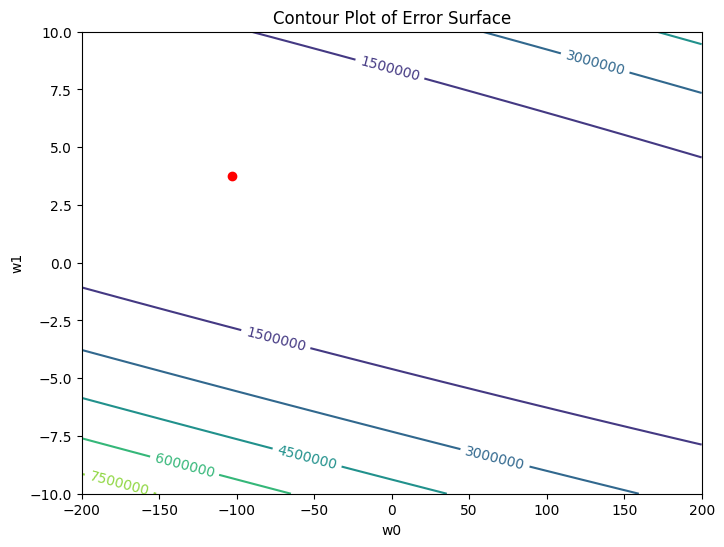

Optimal weights using least squares: w0 = -106.3707, w1 = 3.7644


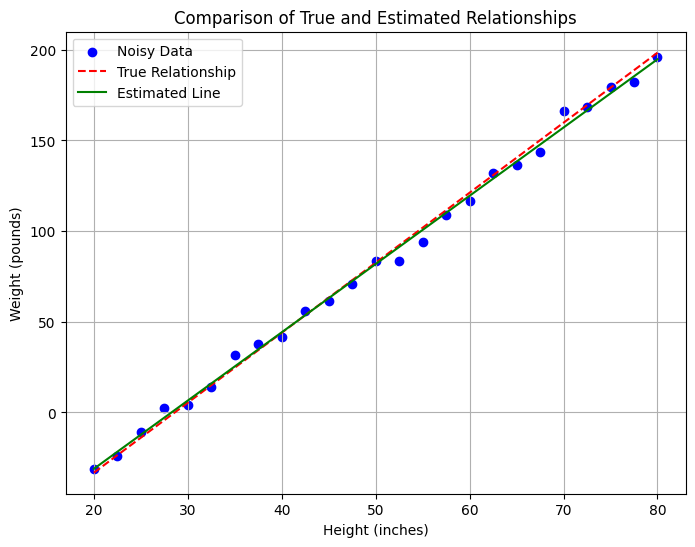

Comparison of estimated weights:
Error Surface: w0 = -103.0303, w1 = 3.7374
Least Squares: w0 = -106.3707, w1 = 3.7644


In [ ]:
#Understanding Error Surface
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

########################################
# Generate meaningful data
########################################
np.random.seed(42)  # For reproducibility

# Generate 25 data points for x in the range [20, 80]
x = np.linspace(20, 80, 25)

# Define the relationship t = 3.86x - 110.42 and add Gaussian noise with variance 20
true_relationship = 3.86 * x - 110.42
noise = np.random.normal(0, np.sqrt(20), size=x.shape)
t = true_relationship + noise

########################################
# Plot scatter plot of data
########################################
plt.figure(figsize=(8, 6))
plt.scatter(x, t, color='blue', label='Noisy Data')
plt.plot(x, true_relationship, color='red', label='True Relationship', linestyle='--')
plt.xlabel('Height (inches)')
plt.ylabel('Weight (pounds)')
plt.title('Scatter Plot of Noisy Data')
plt.legend()
plt.grid()
plt.show()

########################################
# Weight estimation through error surface
########################################

# Compute the error function
def Error(w, t, x):
    # Estimate the target using weights w = [w0, w1]
    y = w[0] + w[1] * x
    # Compute and return the mean squared error
    error = np.sum((y - t) ** 2) * 0.5
    return error

# Sample a bunch of w's around w_opt and compute the associated error
w0_range = np.linspace(-200, 200, 100)
w1_range = np.linspace(-10, 10, 100)
W0, W1 = np.meshgrid(w0_range, w1_range)

# Compute the error surface
E = np.array([Error([w0, w1], t, x) for w0, w1 in zip(W0.ravel(), W1.ravel())]).reshape(W0.shape)

# Plot 3D error surface and contour plots
fig1 = plt.figure(figsize=(12, 6))
ax1 = fig1.add_subplot(111, projection='3d')
surf = ax1.plot_surface(W0, W1, E, cmap='viridis', edgecolor='none')
ax1.set_xlabel('w0')
ax1.set_ylabel('w1')
ax1.set_zlabel('Error')
ax1.set_title('3D Error Surface')
fig1.colorbar(surf, ax=ax1, shrink=1)
plt.show()

fig2 = plt.figure(figsize=(8, 6))
ax2 = fig2.add_subplot(111)
contour = ax2.contour(W0, W1, E)
ax2.clabel(contour, inline=True)
ax2.set_xlabel('w0')
ax2.set_ylabel('w1')
ax2.set_title('Contour Plot of Error Surface')


# Locate the minima of the error surface
min_idx = np.unravel_index(np.argmin(E), E.shape)
w0_min, w1_min = W0[min_idx], W1[min_idx]
print(f"Minimum error at w0 = {w0_min:.4f}, w1 = {w1_min:.4f}")

ax2.plot(w0_min, w1_min, 'ro')
plt.show()

########################################
# Least squares approach to estimate the weights
########################################

def LinearRegression(x, t):
    X = np.column_stack((np.ones_like(x), x))
    w_opt = np.linalg.inv(X.T @ X) @ X.T @ t
    return w_opt

# Estimate optimal weights using LinearRegression function
w_opt = LinearRegression(x, t)
print(f"Optimal weights using least squares: w0 = {w_opt[0]:.4f}, w1 = {w_opt[1]:.4f}")

########################################
# Estimate targets using the input x and estimated weights
########################################

y_estimated = w_opt[0] + w_opt[1] * x

plt.figure(figsize=(8, 6))
plt.scatter(x, t, color='blue', label='Noisy Data')
plt.plot(x, true_relationship, color='red', label='True Relationship', linestyle='--')
plt.plot(x, y_estimated, color='green', label='Estimated Line')
plt.xlabel('Height (inches)')
plt.ylabel('Weight (pounds)')
plt.title('Comparison of True and Estimated Relationships')
plt.legend()
plt.grid()
plt.show()

########################################
# Compare estimated weights from least squares with error surface approach
########################################

print("Comparison of estimated weights:")
print(f"Error Surface: w0 = {w0_min:.4f}, w1 = {w1_min:.4f}")
print(f"Least Squares: w0 = {w_opt[0]:.4f}, w1 = {w_opt[1]:.4f}")


<b> Report your observations </b>

1. The error surface is not similar on all sides.

2. The estimated line is very close to the true line because of no outliers.

3. The weights estimated from the error surface and least squares differ by very small amount.


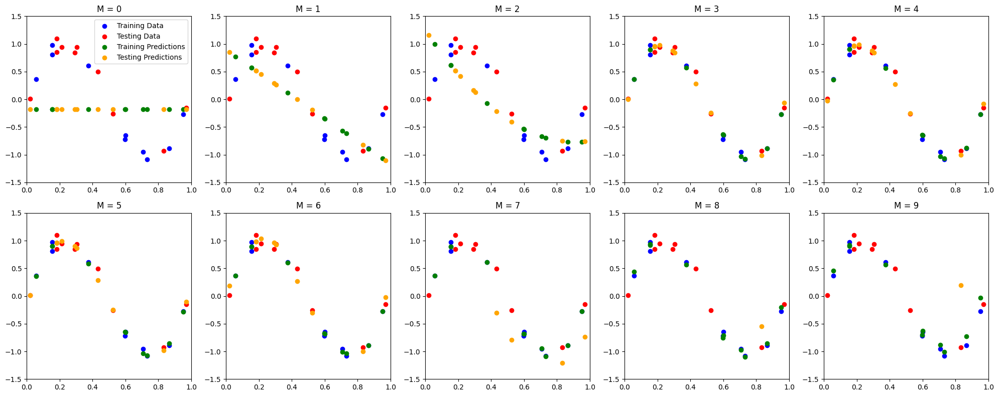

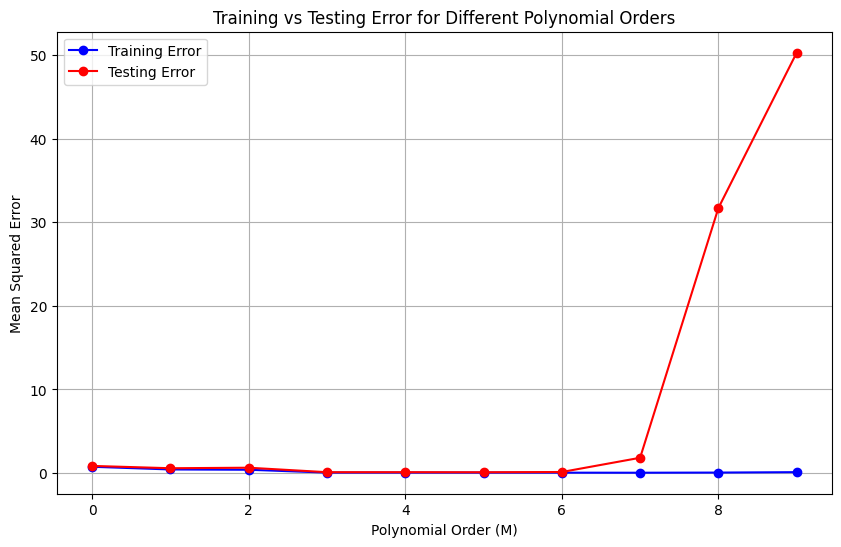

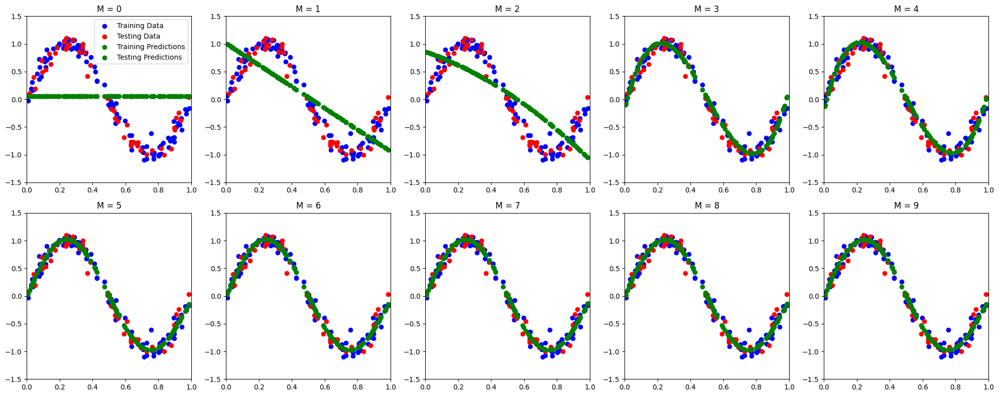

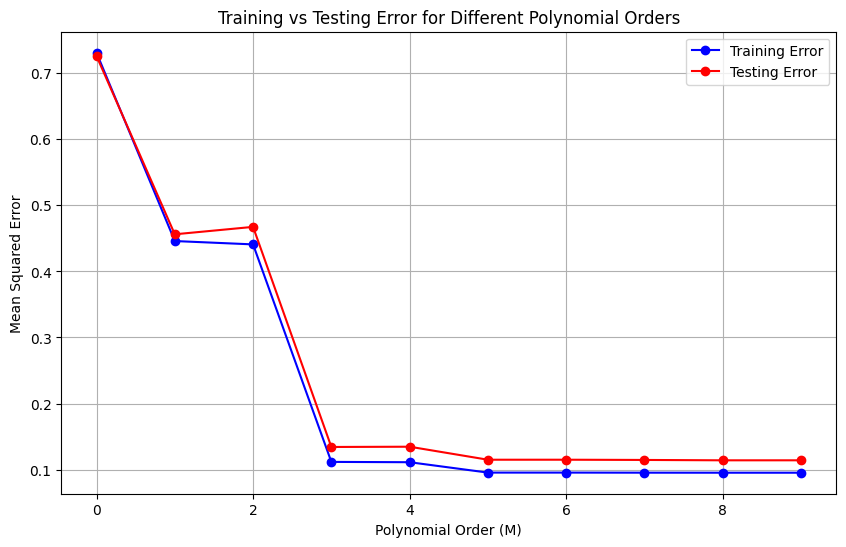

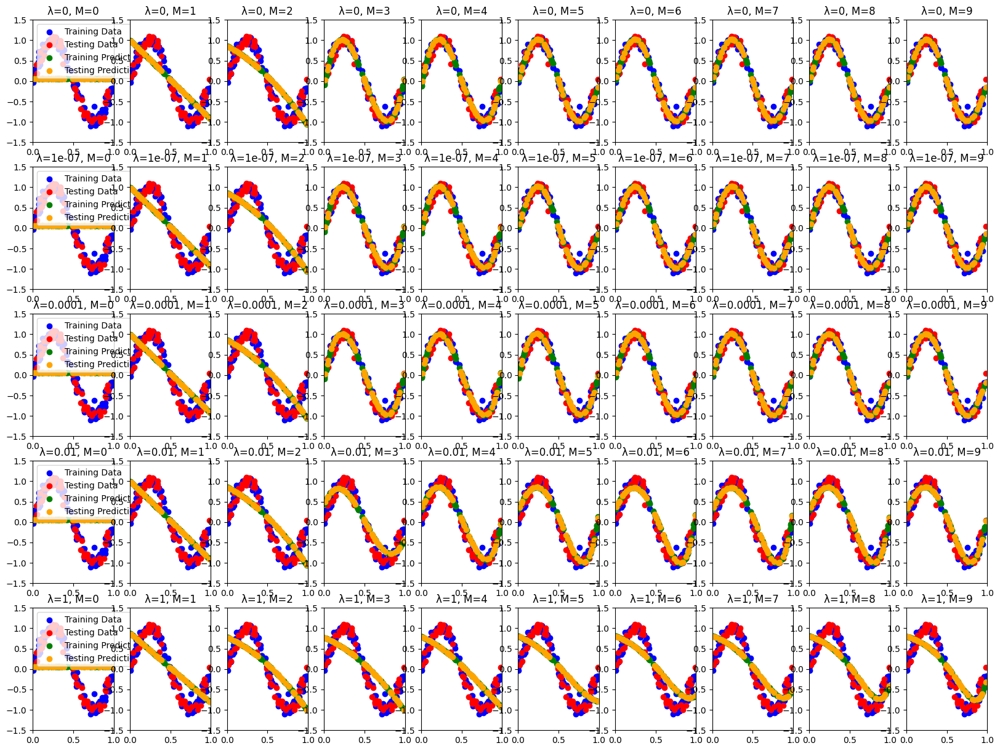

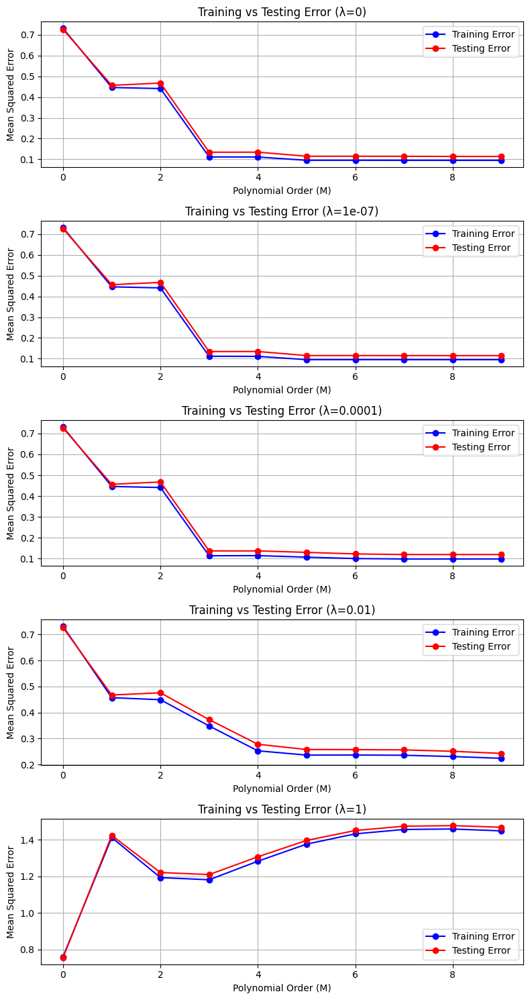

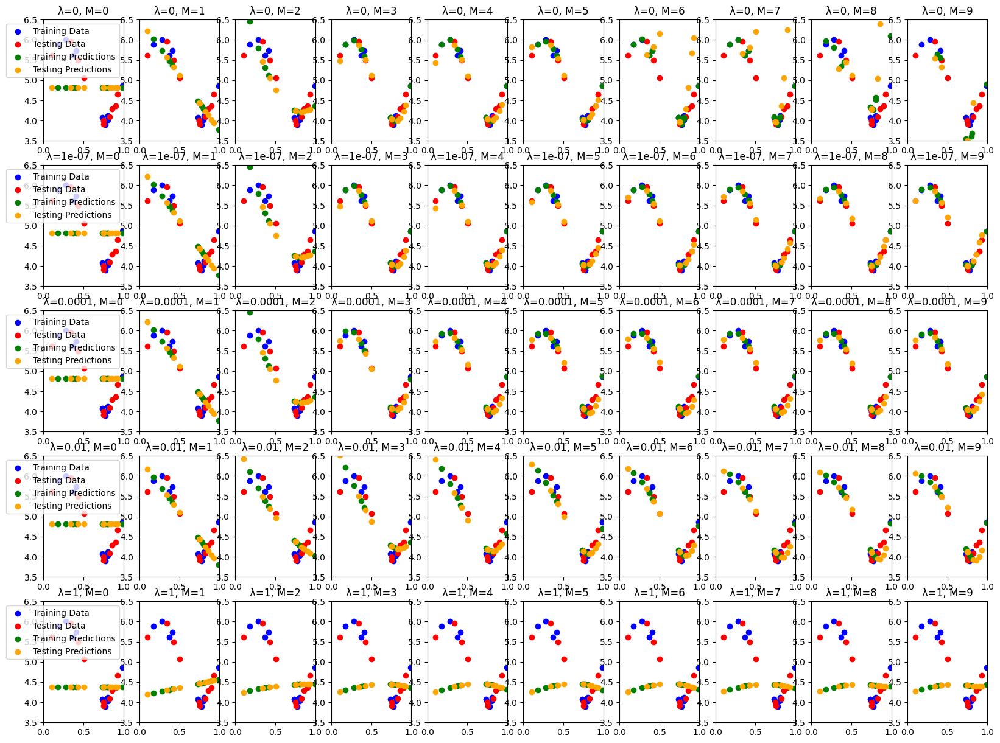

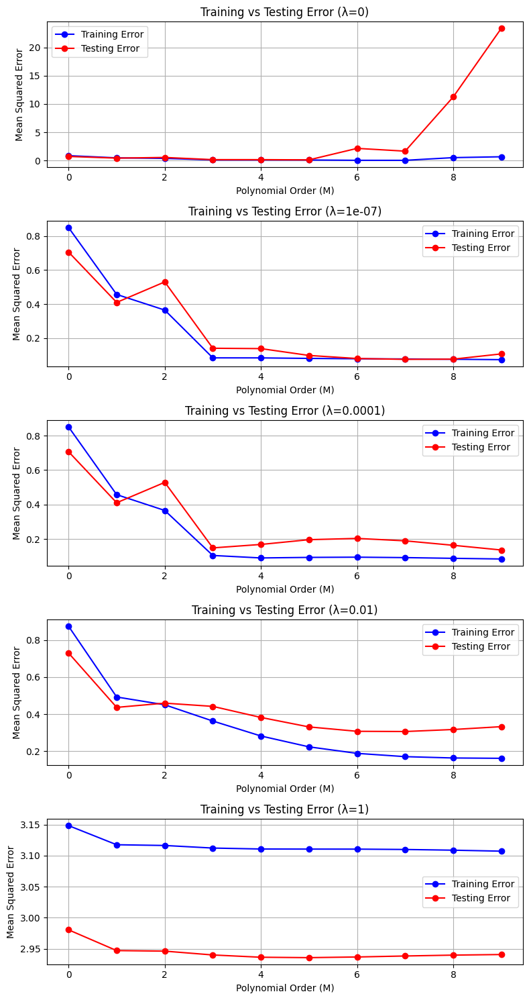

In [ ]:
#Understanding model order and overfitting
########################################
#Generate 20 data points
########################################
np.random.seed(42)

x = np.random.uniform(0,1,20)
t = np.sin(2 * np.pi * x) + np.random.normal(0,0.1,20)

#Obtain train and test splits
x_train = x[:10]
x_test = x[10:]
t_train = t[:10]
t_test = t[10:]


########################################
#Fitting Mth degree polynomial using least squares approach
########################################
#Complete the function
def PolynomialFit(X_train,Y_train,M,lamda = 0): #(training data, training targets, Model order, Regularization coefficient)
    #Transform the data using polynomial kernel
    phi_train = np.column_stack([X_train ** i for i in range(M+1)])
    I = np.identity(phi_train.shape[1])

    #Find Pseudo inverse solution
    w_opt = np.linalg.inv(phi_train.T @ phi_train + lamda * I) @ phi_train.T @ Y_train

    #return the weight vector
    return w_opt

#Complete the function
def PolynomialPred(w_est,X_train,X_test): #(weight,training data, testing data, training targets, testing targets)
    #Estimate the targets for both training and testing data
    M = len(w_est) - 1
    phi_train = np.column_stack([X_train ** i for i in range(M+1)])
    phi_test = np.column_stack([X_test ** i for i in range(M+1)])

    pred_train = phi_train @ w_est
    pred_test = phi_test @ w_est

    #Return training and testing predictions
    return pred_train, pred_test

#Complete the function
def PolynomialPred_Error(w_est,X_train,X_test,Y_train,Y_test, lamda=0): #(weight,training data, testing data, training targets, testing targets)
    #Estimate the targets for both training and testing data
    y_train_pred, y_test_pred = PolynomialPred(w_est, X_train, X_test)

    train_error = np.sqrt(np.mean((Y_train - y_train_pred) ** 2)) + (lamda / 2) * np.linalg.norm(w_est)
    test_error = np.sqrt(np.mean((Y_test - y_test_pred) ** 2)) + (lamda / 2) * np.linalg.norm(w_est)

    #Return training and testing error
    return train_error, test_error

#Iterate through range of M values
M_range=list(range(10))
train_errors = []
test_errors = []

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

for M in M_range:
    #Fit Mth order polynomial i.e estimate optimal w. Use the function "PolynomialFit"
    w_opt = PolynomialFit(x_train, t_train, M)

    #Predict training and testing targets using estimated w. Use the function "PolynomialPred"
    y_train_pred, y_test_pred = PolynomialPred(w_opt, x_train, x_test)

    #Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
    train_e, test_e = PolynomialPred_Error(w_opt, x_train, x_test, t_train, t_test)

    #Store them for plotting
    train_errors.append(train_e)
    test_errors.append(test_e)


    #Plot training and testing estimates alogwith the original targets
    ax = axes[M]
    ax.scatter(x_train,t_train,color='blue',label='Training Data')
    ax.scatter(x_test, t_test, color='red', label='Testing Data')
    ax.scatter(x_train, y_train_pred, color='green', label='Training Predictions')
    ax.scatter(x_test, y_test_pred, color='orange', label='Testing Predictions')
    ax.set_title(f'M = {M}')
    ax.set_xlim(0, 1)
    ax.set_ylim(-1.5, 1.5)
    if M == 0:
        ax.legend()

plt.tight_layout()
plt.show()

#Plot training error vs polynomial order, and testing error vs polynomial order

plt.figure(figsize=(10, 6))
plt.plot(M_range, train_errors, 'bo-', label='Training Error')
plt.plot(M_range, test_errors, 'ro-', label='Testing Error')
plt.xlabel('Polynomial Order (M)')
plt.ylabel('Mean Squared Error')
plt.title('Training vs Testing Error for Different Polynomial Orders')
plt.legend()
plt.grid()
plt.show()



########################################
#Increase the size of training data set to 100 points and repeat the experiments
########################################
x = np.random.uniform(0,1,150)
t = np.sin(2 * np.pi * x) + np.random.normal(0,0.1,150)
x_train = x[:100]
x_test = x[100:]
t_train = t[:100]
t_test = t[100:]

#Iterate through range of M values
M_range=list(range(10))
train_errors = []
test_errors = []

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

for M in M_range:
    #Fit Mth order polynomial i.e estimate optimal w. Use the function "PolynomialFit"
    w_opt = PolynomialFit(x_train, t_train, M)

    #Predict training and testing targets using estimated w. Use the function "PolynomialPred"
    y_train_pred, y_test_pred = PolynomialPred(w_opt, x_train, x_test)

    #Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
    train_e, test_e = PolynomialPred_Error(w_opt, x_train, x_test, t_train, t_test)

    #Store them for plotting
    train_errors.append(train_e)
    test_errors.append(test_e)

    #Plot training and testing estimates alogwith the original targets
    ax = axes[M]
    ax.scatter(x_train,t_train,color='blue',label='Training Data')
    ax.scatter(x_test, t_test, color='red', label='Testing Data')
    ax.scatter(x_train, y_train_pred, color='green', label='Training Predictions')
    ax.scatter(x_test, y_test_pred, color='green', label='Testing Predictions')
    ax.set_title(f'M = {M}')
    ax.set_xlim(0, 1)
    ax.set_ylim(-1.5, 1.5)
    if M == 0:
        ax.legend()

plt.tight_layout()
plt.show()

#Plot training error vs polynomial order, and testing error vs polynomial order

plt.figure(figsize=(10, 6))
plt.plot(M_range, train_errors, 'bo-', label='Training Error')
plt.plot(M_range, test_errors, 'ro-', label='Testing Error')
plt.xlabel('Polynomial Order (M)')
plt.ylabel('Mean Squared Error')
plt.title('Training vs Testing Error for Different Polynomial Orders')
plt.legend()
plt.grid()
plt.show()


# ########################################
# #Effect of regularization
# ########################################
# #Consider a set of lambda's. For example: lamdas = [0, 1e-7 , 1e-4, 1e-2, 1]
# #Repeat the experiments, i.e., plot the prediction and error in predictions with respect to model order. Contrast these results with those obtained without regularization.

lamdas = [0, 1e-7 , 1e-4, 1e-2, 1]
train_errors = []
test_errors = []

fig, axes = plt.subplots(len(lamdas), len(M_range), figsize=(20, len(lamdas) * 3))
fig_error, axes_error = plt.subplots(len(lamdas), 1, figsize=(8, len(lamdas) * 3))

for i, lamda in enumerate(lamdas):
  for j,m in enumerate(M_range):
    w_opt = PolynomialFit(x_train, t_train, m, lamda)
    y_train_pred, y_test_pred = PolynomialPred(w_opt, x_train, x_test)
    train_e, test_e = PolynomialPred_Error(w_opt, x_train, x_test, t_train, t_test, lamda)
    train_errors.append(train_e)
    test_errors.append(test_e)

    ax = axes[i,j]
    ax.scatter(x_train,t_train,color='blue',label='Training Data')
    ax.scatter(x_test, t_test, color='red', label='Testing Data')
    ax.scatter(x_train, y_train_pred, color='green', label='Training Predictions')
    ax.scatter(x_test, y_test_pred, color='orange', label='Testing Predictions')
    ax.set_title(f'λ={lamda}, M={m}')
    ax.set_xlim(0, 1)
    ax.set_ylim(-1.5, 1.5)
    if j == 0:
        ax.legend()

    plt.tight_layout()

  ax_err = axes_error[i]
  ax_err.plot(M_range, train_errors, 'bo-', label='Training Error')
  ax_err.plot(M_range, test_errors, 'ro-', label='Testing Error')
  ax_err.set_xlabel('Polynomial Order (M)')
  ax_err.set_ylabel('Mean Squared Error')
  ax_err.set_title(f'Training vs Testing Error (λ={lamda})')
  ax_err.legend()
  ax_err.grid()
  train_errors = []
  test_errors = []

fig_error.tight_layout()
plt.show()


########################################
#Effect of bias regularization
########################################
#Modify the function i.e include bias
#Generate data
x = np.random.uniform(0,1,20)
t = 5 + np.sin(2 * np.pi * x) + np.random.normal(0,0.1,20)
x_train = x[:10]
x_test = x[10:]
t_train = t[:10]
t_test = t[10:]

#Estimate the polynomial with and without regularization constraint

lamdas = [0, 1e-7 , 1e-4, 1e-2, 1]

fig_1, axes_1 = plt.subplots(len(lamdas), len(M_range), figsize=(20, len(lamdas) * 3))
fig_error_1, axes_error_1 = plt.subplots(len(lamdas), 1, figsize=(8, len(lamdas) * 3))

for i, lamda in enumerate(lamdas):
  train_errors = []
  test_errors = []

  for j,m in enumerate(M_range):
    w_opt = PolynomialFit(x_train, t_train, m, lamda)
    y_train_pred, y_test_pred = PolynomialPred(w_opt, x_train, x_test)
    train_e, test_e = PolynomialPred_Error(w_opt, x_train, x_test, t_train, t_test, lamda)
    train_errors.append(train_e)
    test_errors.append(test_e)

    ax = axes_1[i,j]
    ax.scatter(x_train,t_train,color='blue',label='Training Data')
    ax.scatter(x_test, t_test, color='red', label='Testing Data')
    ax.scatter(x_train, y_train_pred, color='green', label='Training Predictions')
    ax.scatter(x_test, y_test_pred, color='orange', label='Testing Predictions')
    ax.set_title(f'λ={lamda}, M={m}')
    ax.set_xlim(0, 1)
    ax.set_ylim(3.5, 6.5)
    if j == 0:
        ax.legend()
    plt.tight_layout()

  ax_err = axes_error_1[i]
  ax_err.plot(M_range, train_errors, 'bo-', label='Training Error')
  ax_err.plot(M_range, test_errors, 'ro-', label='Testing Error')
  ax_err.set_xlabel('Polynomial Order (M)')
  ax_err.set_ylabel('Mean Squared Error')
  ax_err.set_title(f'Training vs Testing Error (λ={lamda})')
  ax_err.legend()
  ax_err.grid()

fig_error_1.tight_layout()
plt.show()


<b> Report your observations </b>

1. The initial model fits best at approximately M = 5. The errors increase as model order increases.

2. The regularization term helps in reducing overfitting by penalizing large weights.

3. The training errors seemed to reduce and test errors increase as the model order increases, suggesting some kind of overfit.

4. Increasing the size of the training dataset helps in reducing overfitting.

5. Shifting the function slightly, changed the model order that fit the data best. With significant effect due to regularization coefficient, sometimes the model did not fit the data at all.


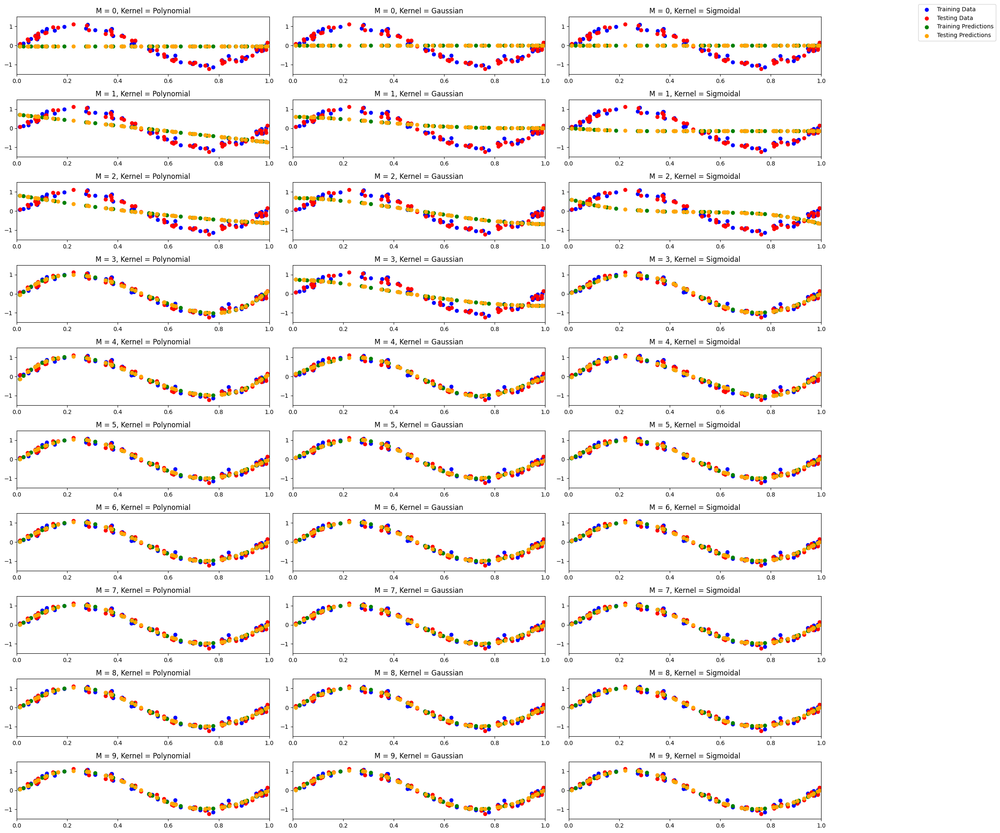

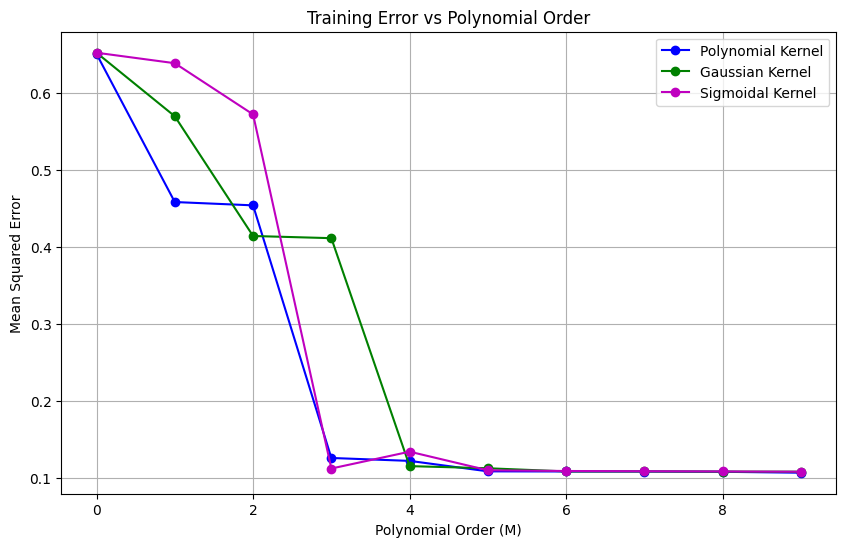

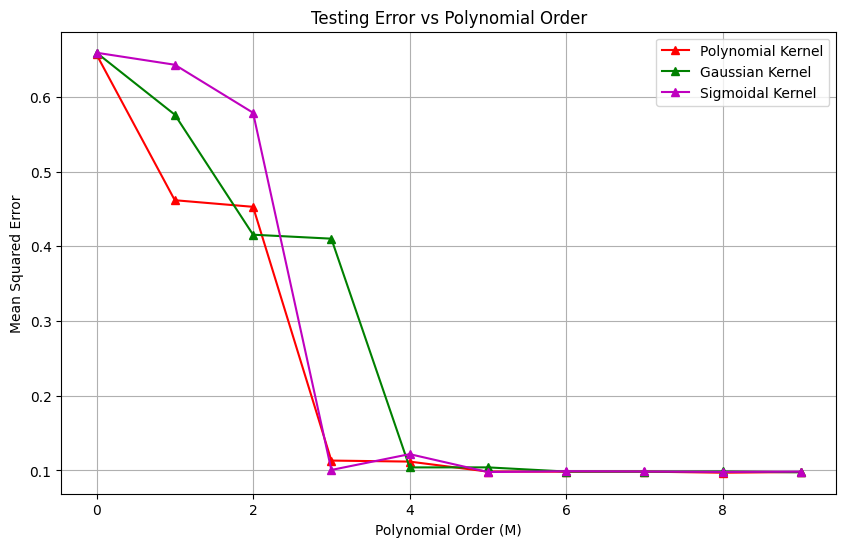

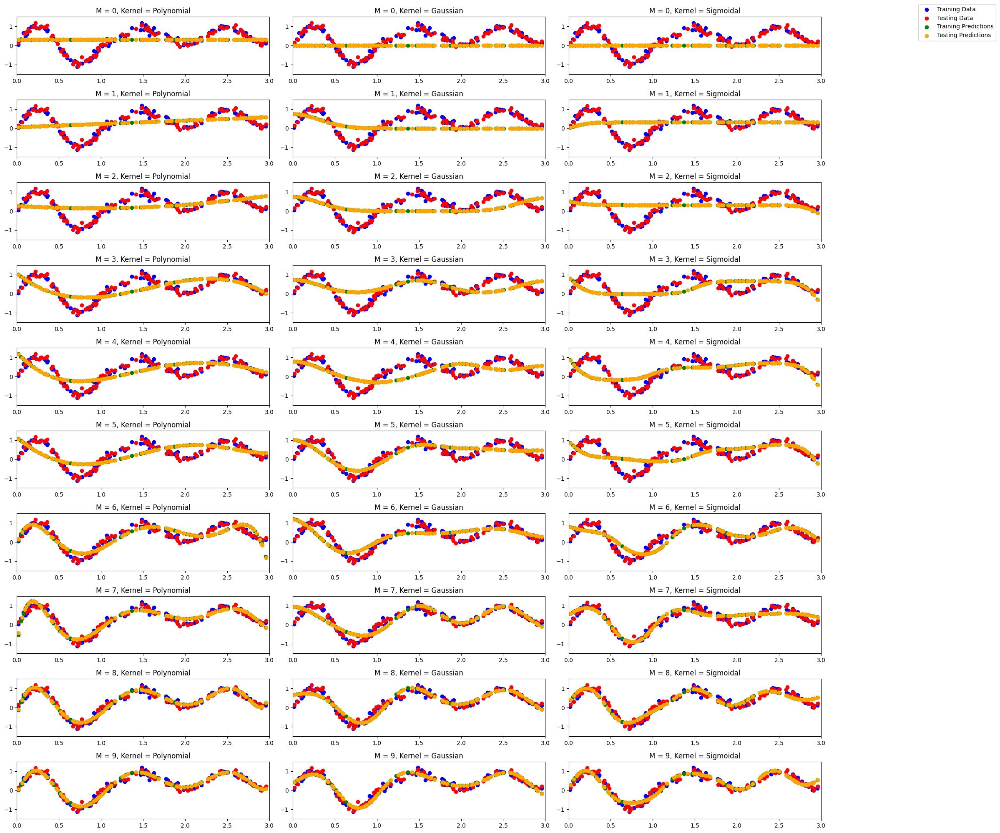

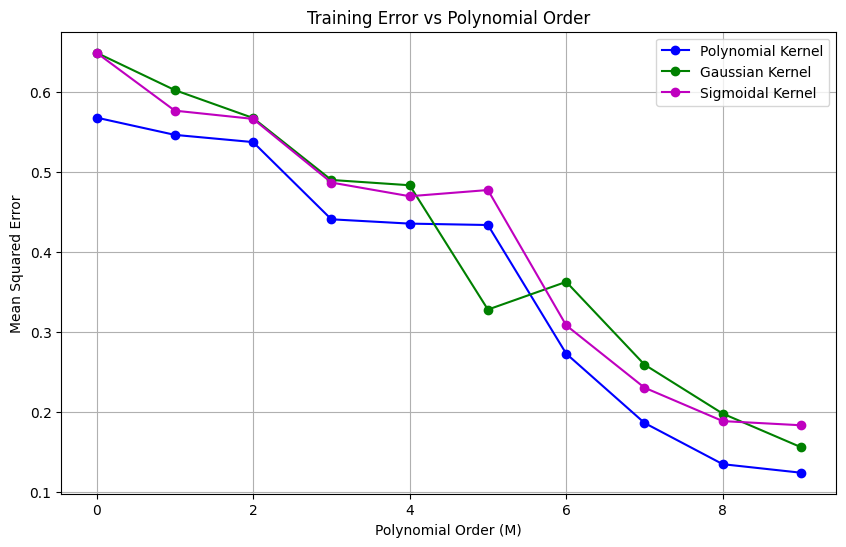

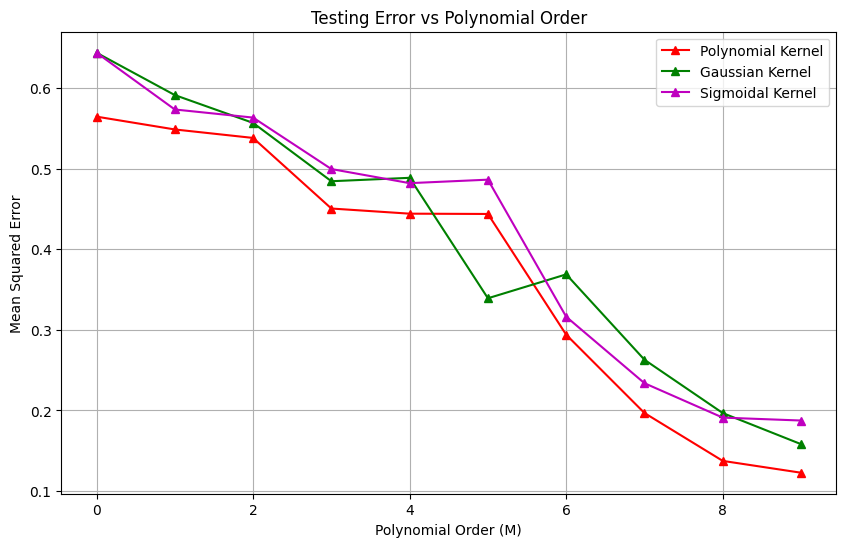

In [ ]:
#Understanding the choice of kernel

########################################
#Generate 100 data points
########################################
x = np.random.uniform(0,1,100)
x = np.sort(x)
t = np.sin(2 * np.pi * x) + np.random.normal(0,0.1,100)

#Obtian train and test splits
#Take even samples for training and odd samples for testing
x_train = x[::2]
x_test = x[1::2]
t_train = t[::2]
t_test = t[1::2]

#Function to transform data
def KernelTransform(X_train,kernelType,M, st=0, end=1):
  if kernelType=='polynomial':
    X = np.column_stack([X_train ** i for i in range(M+1)])

  if kernelType=='gaussian':
    means = np.linspace(st,end, M).reshape(-1, 1)
    var = 0.1
    X = np.exp(-((X_train.reshape(-1,1) - means.T) ** 2) / (2 * var))

  if kernelType == 'sigmoidal':
    means = np.linspace(st,end, M).reshape(-1, 1)
    X = np.tanh((X_train.reshape(-1,1) - means.T)/0.2)

  return X

#Function to estimate the parameters
def KernelRegressionFit(X_train,Y_train,kernelType,M,lamda = 0, st=0, end=1): #(training data, training targets, type of kernel, regularization coefficient)
    #kernelType : {Polynomial,Gaussian,Sigmoid}

    X = []
    if kernelType=='polynomial':
      #Use polynomial kernel to transform the data
      X = KernelTransform(X_train,kernelType,M, st, end)

    if kernelType=='gaussian':
      #Use Gaussian kernel to transform the data
      X = KernelTransform(X_train,kernelType,M, st, end)

    if kernelType=='sigmoidal':
      #Use Sigmoid kernel to transform the data
      X = KernelTransform(X_train,kernelType,M, st, end)

    #Estimate weights using Pseudo i0, 0, 3) solution
    I = np.identity(X.shape[1])
    w_opt = np.linalg.inv(X.T @ X + lamda * I) @ X.T @ Y_train

    #Return the estimated weights
    return w_opt

#Function to compute the training and testing errors from the current weight estimates
def KernelRegressionPred_Error(w_est,X_train,Y_train,X_test,Y_test,kernelType, lamda=0, st=0, end=1):
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    X_tr = []
    X_te = []
    #X_train = np.reshape(X_train, (1,-1))
    #Y_train = np.reshape(Y_train, (1,-1))
    #X_test = np.reshape(X_test, (1,-1))
    #Y_test = np.reshape(Y_test, (1,-1))

    y_train_pred = []
    y_test_pred = []

    if kernelType=='polynomial':
      #Use polynomial kernel to transform the data
      M = len(w_est)-1
      X_tr = KernelTransform(X_train,kernelType,M, st, end)
      X_te = KernelTransform(X_test,kernelType,M, st, end)

      y_train_pred = X_tr @ w_est
      y_test_pred = X_te @ w_est

    if kernelType=='gaussian':
      #Use Gaussian kernel to transform the data
      M = len(w_est)
      X_tr = KernelTransform(X_train,kernelType,M, st, end)
      X_te = KernelTransform(X_test,kernelType,M, st, end)

      y_train_pred = X_tr @ w_est
      y_test_pred = X_te @ w_est

    if kernelType=='sigmoidal':
      #Use Sigmoid kernel to transform the data
      M = len(w_est)
      X_tr = KernelTransform(X_train,kernelType,M, st, end)
      X_te = KernelTransform(X_test,kernelType,M, st, end)

      y_train_pred = X_tr @ w_est
      y_test_pred = X_te @ w_est


    #Estimate training and testing targets
    TrainError = np.sqrt(np.mean((Y_train - y_train_pred) ** 2)) + (lamda / 2) * np.linalg.norm(w_est)
    TestError = np.sqrt(np.mean((Y_test - y_test_pred) ** 2)) + (lamda / 2) * np.linalg.norm(w_est)

    #Compute and return the training and testing errors
    return TrainError,TestError


#Iterate through range of M values
M_range=list(range(10))

polynomial_tr_error = []
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error = []
sigmoid_te_error = []

fig, axes = plt.subplots(len(M_range), 3, figsize=(20, 20))

for i,M in enumerate(M_range):
    #Fit Mth order polynomial using three kernels i.e {Polynomial,Gaussian,Sigmoid}
    w_opt_poly = KernelRegressionFit(x_train, t_train, 'polynomial', M, 0, 0, 1)
    w_opt_gaussian = KernelRegressionFit(x_train, t_train, 'gaussian', M, 0, 0, 1)
    w_opt_sigmoid = KernelRegressionFit(x_train, t_train, 'sigmoidal', M, 0, 0, 1)

    #Predict training and testing targets using estimated w
    x_tr_poly = KernelTransform(x_train, 'polynomial', M, 0, 1)
    x_te_poly = KernelTransform(x_test, 'polynomial', M, 0, 1)
    x_tr_gaussian = KernelTransform(x_train, 'gaussian', M, 0, 1)
    x_te_gaussian = KernelTransform(x_test, 'gaussian', M, 0, 1)
    x_tr_sigmoid = KernelTransform(x_train, 'sigmoidal', M, 0, 1)
    x_te_sigmoid = KernelTransform(x_test, 'sigmoidal', M, 0, 1)

    y_train_pred_poly = x_tr_poly @ w_opt_poly
    y_test_pred_poly = x_te_poly @ w_opt_poly
    y_train_pred_gaussian = x_tr_gaussian @ w_opt_gaussian
    y_test_pred_gaussian = x_te_gaussian @ w_opt_gaussian
    y_train_pred_sigmoid = x_tr_sigmoid @ w_opt_sigmoid
    y_test_pred_sigmoid = x_te_sigmoid @ w_opt_sigmoid

    #Predict errors on both training and testing data using estimated w
    train_e_poly, test_e_poly = KernelRegressionPred_Error(w_opt_poly, x_train, t_train, x_test, t_test, 'polynomial', 0, 0, 1)
    train_e_gaussian, test_e_gaussian = KernelRegressionPred_Error(w_opt_gaussian, x_train, t_train, x_test, t_test, 'gaussian', 0, 0, 1)
    train_e_sigmoid, test_e_sigmoid = KernelRegressionPred_Error(w_opt_sigmoid, x_train, t_train, x_test, t_test, 'sigmoidal', 0, 0, 1)

    #Store them for plotting
    polynomial_tr_error.append(train_e_poly)
    polynomial_te_error.append(test_e_poly)
    gaussian_tr_error.append(train_e_gaussian)
    gaussian_te_error.append(test_e_gaussian)
    sigmoid_tr_error.append(train_e_sigmoid)
    sigmoid_te_error.append(test_e_sigmoid)

    ax = axes[i,0]
    ax.scatter(x_train,t_train,color='blue',label='Training Data')
    ax.scatter(x_test, t_test, color='red', label='Testing Data')
    ax.scatter(x_train, y_train_pred_poly, color='green', label='Training Predictions')
    ax.scatter(x_test, y_test_pred_poly, color='orange', label='Testing Predictions')
    ax.set_title(f'M = {M}, Kernel = Polynomial')
    ax.set_xlim(0, 1)
    ax.set_ylim(-1.5, 1.5)
    # if i == 0:
    #     ax.legend()

    ax = axes[i,1]
    ax.scatter(x_train,t_train,color='blue',label='Training Data')
    ax.scatter(x_test, t_test, color='red', label='Testing Data')
    ax.scatter(x_train, y_train_pred_gaussian, color='green', label='Training Predictions')
    ax.scatter(x_test, y_test_pred_gaussian, color='orange', label='Testing Predictions')
    ax.set_title(f'M = {M}, Kernel = Gaussian')
    ax.set_xlim(0, 1)
    ax.set_ylim(-1.5, 1.5)
    # if i == 0:
    #     ax.legend()

    ax = axes[i,2]
    ax.scatter(x_train,t_train,color='blue',label='Training Data')
    ax.scatter(x_test, t_test, color='red', label='Testing Data')
    ax.scatter(x_train, y_train_pred_sigmoid, color='green', label='Training Predictions')
    ax.scatter(x_test, y_test_pred_sigmoid, color='orange', label='Testing Predictions')
    ax.set_title(f'M = {M}, Kernel = Sigmoidal')
    ax.set_xlim(0, 1)
    ax.set_ylim(-1.5, 1.5)
    # if i == 0:
    #     ax.legend()

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.2, 1))

plt.tight_layout()
plt.show()

#Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels
plt.figure(figsize=(10, 6))

# Training errors
plt.plot(M_range, polynomial_tr_error, 'bo-', label='Polynomial Kernel')
plt.plot(M_range, gaussian_tr_error, 'go-', label='Gaussian Kernel')
plt.plot(M_range, sigmoid_tr_error, 'mo-', label='Sigmoidal Kernel')

plt.xlabel('Polynomial Order (M)')
plt.ylabel('Mean Squared Error')
plt.title('Training Error vs Polynomial Order')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(10, 6))

# Testing errors
plt.plot(M_range, polynomial_te_error, 'r^-', label='Polynomial Kernel')
plt.plot(M_range, gaussian_te_error, 'g^-', label='Gaussian Kernel')
plt.plot(M_range, sigmoid_te_error, 'm^-', label='Sigmoidal Kernel')

plt.xlabel('Polynomial Order (M)')
plt.ylabel('Mean Squared Error')
plt.title('Testing Error vs Polynomial Order')
plt.legend()
plt.grid()
plt.show()


########################################
#Repeat the experiments by changing target function
########################################
def triangle_wave(x):
    return 2 * np.abs((x - 1.5) % 1 - 0.5) - 1

def gaussian_function(x):
    return np.exp(-((x - 2.5) ** 2) / 0.1)

# Generate data
np.random.seed(42)
x = np.random.uniform(0, 3, 200)
x = np.sort(x)
noise = np.random.normal(0, 0.1, 200)

mask1 = x < 1
mask2 = (x >= 1) & (x < 2)
mask3 = x >= 2

sin_end = np.sin(2 * np.pi * 1)
triangle_shifted = triangle_wave(x) - triangle_wave(1) + sin_end  # Shift to start from sin_end

tri_end = triangle_shifted[np.where(x >= 2)[0][0]]
gaussian_shifted = gaussian_function(x) - gaussian_function(2) + tri_end  # Shift to start from tri_end

# Construct the target function
t = np.zeros_like(x)
t[mask1] = np.sin(2 * np.pi * x[mask1]) + noise[mask1]
t[mask2] = triangle_shifted[mask2] + noise[mask2]
t[mask3] = gaussian_shifted[mask3] + noise[mask3]

x_train = x[::2]
x_test = x[1::2]
t_train = t[::2]
t_test = t[1::2]

M_range=list(range(10))

polynomial_tr_error = []
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error = []
sigmoid_te_error = []

fig, axes = plt.subplots(len(M_range), 3, figsize=(20, 20))

for i,M in enumerate(M_range):
    #Fit Mth order polynomial using three kernels i.e {Polynomial,Gaussian,Sigmoid}
    w_opt_poly = KernelRegressionFit(x_train, t_train, 'polynomial', M, 0, 0, 3)
    w_opt_gaussian = KernelRegressionFit(x_train, t_train, 'gaussian', M, 0, 0, 3)
    w_opt_sigmoid = KernelRegressionFit(x_train, t_train, 'sigmoidal', M, 0, 0, 3)

    #Predict training and testing targets using estimated w
    x_tr_poly = KernelTransform(x_train, 'polynomial', M, 0, 3)
    x_te_poly = KernelTransform(x_test, 'polynomial', M, 0, 3)
    x_tr_gaussian = KernelTransform(x_train, 'gaussian', M, 0, 3)
    x_te_gaussian = KernelTransform(x_test, 'gaussian', M, 0, 3)
    x_tr_sigmoid = KernelTransform(x_train, 'sigmoidal', M, 0, 3)
    x_te_sigmoid = KernelTransform(x_test, 'sigmoidal', M, 0, 3)

    y_train_pred_poly = x_tr_poly @ w_opt_poly
    y_test_pred_poly = x_te_poly @ w_opt_poly
    y_train_pred_gaussian = x_tr_gaussian @ w_opt_gaussian
    y_test_pred_gaussian = x_te_gaussian @ w_opt_gaussian
    y_train_pred_sigmoid = x_tr_sigmoid @ w_opt_sigmoid
    y_test_pred_sigmoid = x_te_sigmoid @ w_opt_sigmoid

    #Predict errors on both training and testing data using estimated w
    train_e_poly, test_e_poly = KernelRegressionPred_Error(w_opt_poly, x_train, t_train, x_test, t_test, 'polynomial', 0, 0, 3)
    train_e_gaussian, test_e_gaussian = KernelRegressionPred_Error(w_opt_gaussian, x_train, t_train, x_test, t_test, 'gaussian', 0, 0, 3)
    train_e_sigmoid, test_e_sigmoid = KernelRegressionPred_Error(w_opt_sigmoid, x_train, t_train, x_test, t_test, 'sigmoidal', 0, 0, 3)

    #Store them for plotting
    polynomial_tr_error.append(train_e_poly)
    polynomial_te_error.append(test_e_poly)
    gaussian_tr_error.append(train_e_gaussian)
    gaussian_te_error.append(test_e_gaussian)
    sigmoid_tr_error.append(train_e_sigmoid)
    sigmoid_te_error.append(test_e_sigmoid)

    ax = axes[i,0]
    ax.scatter(x_train,t_train,color='blue',label='Training Data')
    ax.scatter(x_test, t_test, color='red', label='Testing Data')
    ax.scatter(x_train, y_train_pred_poly, color='green', label='Training Predictions')
    ax.scatter(x_test, y_test_pred_poly, color='orange', label='Testing Predictions')
    ax.set_title(f'M = {M}, Kernel = Polynomial')
    ax.set_xlim(0, 3)
    ax.set_ylim(-1.5, 1.5)
    # if i == 0:
    #     ax.legend()

    ax = axes[i,1]
    ax.scatter(x_train,t_train,color='blue',label='Training Data')
    ax.scatter(x_test, t_test, color='red', label='Testing Data')
    ax.scatter(x_train, y_train_pred_gaussian, color='green', label='Training Predictions')
    ax.scatter(x_test, y_test_pred_gaussian, color='orange', label='Testing Predictions')
    ax.set_title(f'M = {M}, Kernel = Gaussian')
    ax.set_xlim(0, 3)
    ax.set_ylim(-1.5, 1.5)
    # if i == 0:
    #     ax.legend()

    ax = axes[i,2]
    ax.scatter(x_train,t_train,color='blue',label='Training Data')
    ax.scatter(x_test, t_test, color='red', label='Testing Data')
    ax.scatter(x_train, y_train_pred_sigmoid, color='green', label='Training Predictions')
    ax.scatter(x_test, y_test_pred_sigmoid, color='orange', label='Testing Predictions')
    ax.set_title(f'M = {M}, Kernel = Sigmoidal')
    ax.set_xlim(0, 3)
    ax.set_ylim(-1.5, 1.5)
    # if i == 0:
    #     ax.legend()

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.2, 1))

plt.tight_layout()
plt.show()

#Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels
plt.figure(figsize=(10, 6))

# Training errors
plt.plot(M_range, polynomial_tr_error, 'bo-', label='Polynomial Kernel')
plt.plot(M_range, gaussian_tr_error, 'go-', label='Gaussian Kernel')
plt.plot(M_range, sigmoid_tr_error, 'mo-', label='Sigmoidal Kernel')

plt.xlabel('Polynomial Order (M)')
plt.ylabel('Mean Squared Error')
plt.title('Training Error vs Polynomial Order')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(10, 6))

# Testing errors
plt.plot(M_range, polynomial_te_error, 'r^-', label='Polynomial Kernel')
plt.plot(M_range, gaussian_te_error, 'g^-', label='Gaussian Kernel')
plt.plot(M_range, sigmoid_te_error, 'm^-', label='Sigmoidal Kernel')

plt.xlabel('Polynomial Order (M)')
plt.ylabel('Mean Squared Error')
plt.title('Testing Error vs Polynomial Order')
plt.legend()
plt.grid()
plt.show()



<b> Report your observations </b>

1. Since sine is not locally changing, polynomial kernel performs the best. Sigmoid kernal performs equally well.

2. After the model fits to the data, it seems that increasing the model order initially reduces the error but then leads to overfitting.

3. The new function is locally changing so it is expected that Gaussian or sigmoid kernel would perform better, but in this case, even the polynomial kernel seems to perform similar to the Local kernels, in fact even better than them.

4. The polynomial kernel performs the best among the three kernels for the given target function. The Gaussian kernel performs better than the Sigmoidal kernel.

5. The Gaussian kernel is able to capture the local patterns in the data. The Sigmoidal kernel is not able to capture the patterns in the data effectively.

6. The performance of the kernels is dependent on the choice of the kernel parameters. The choice of the kernel is crucial in determining the performance of the model.


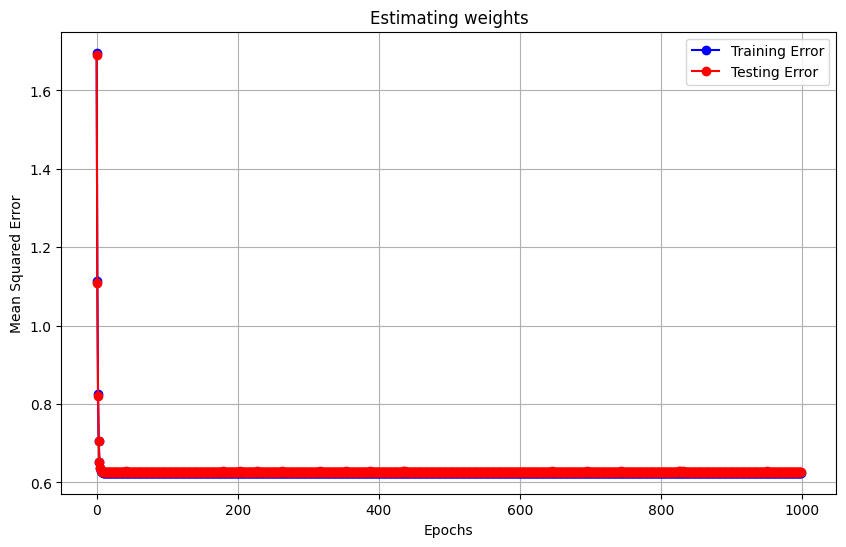

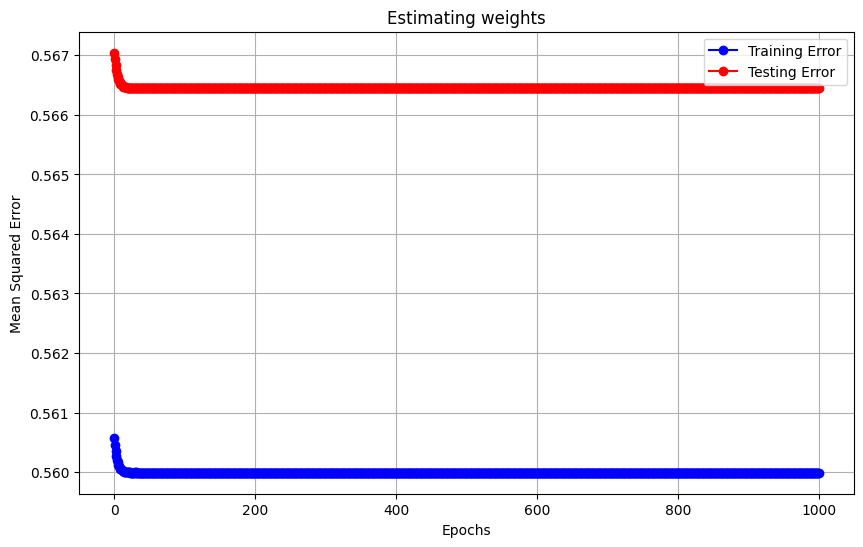

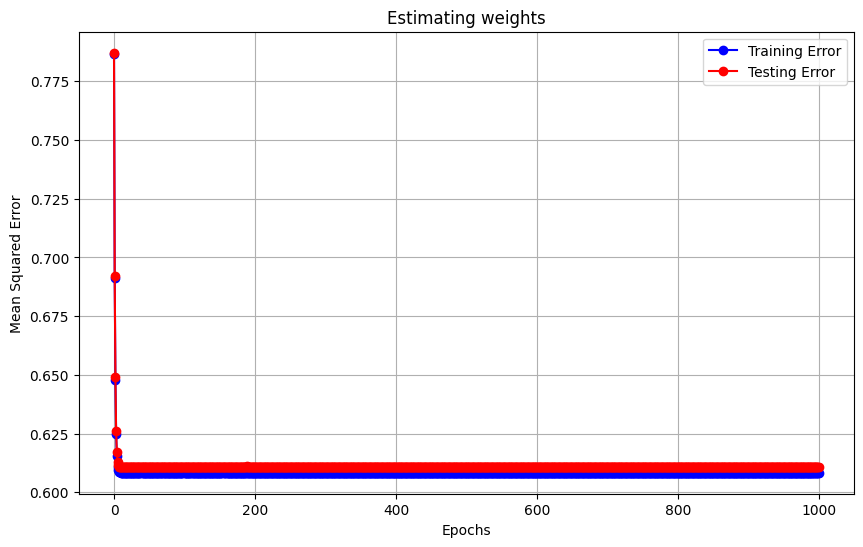

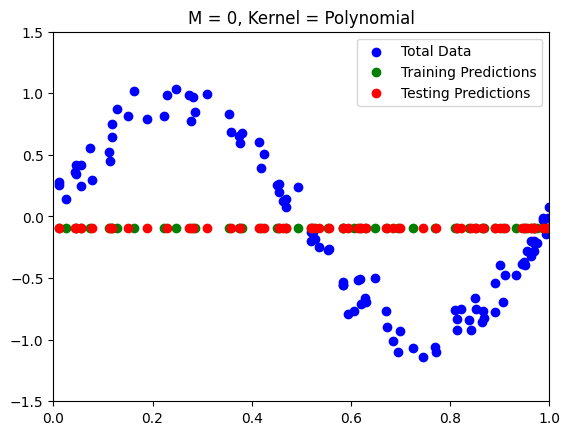

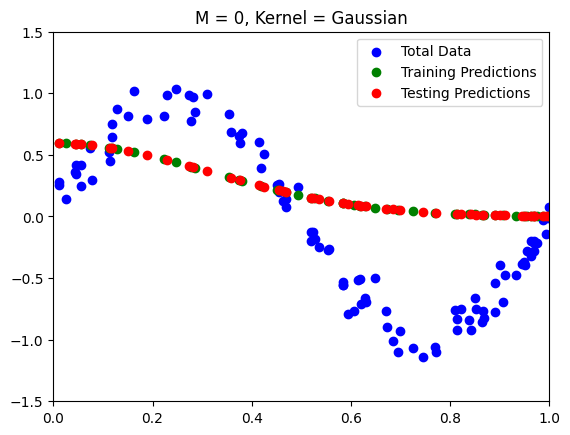

...

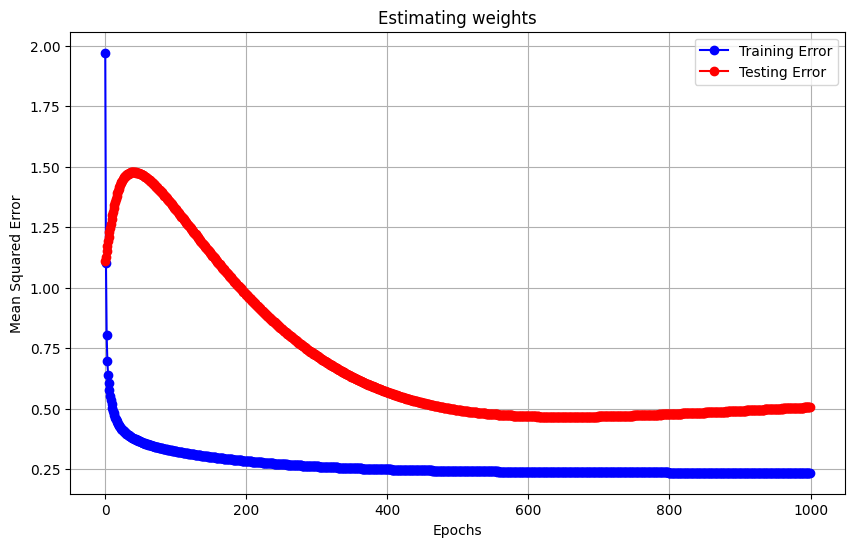

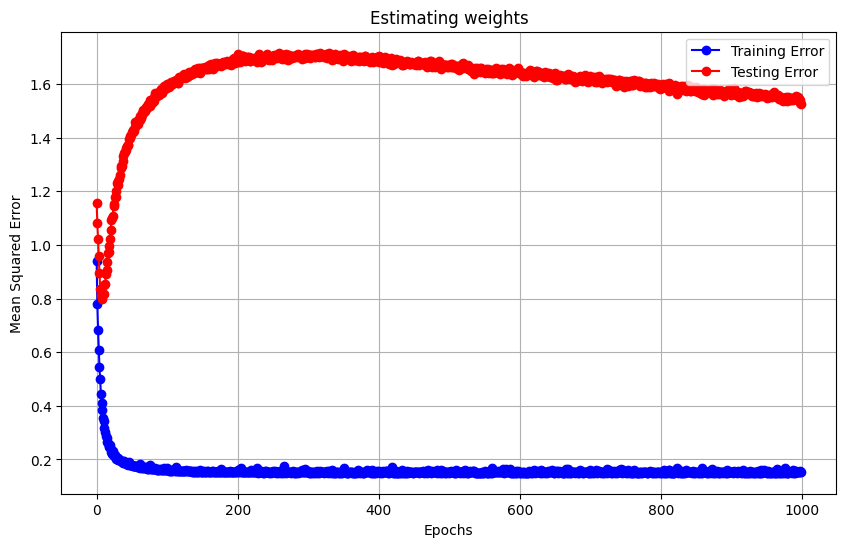

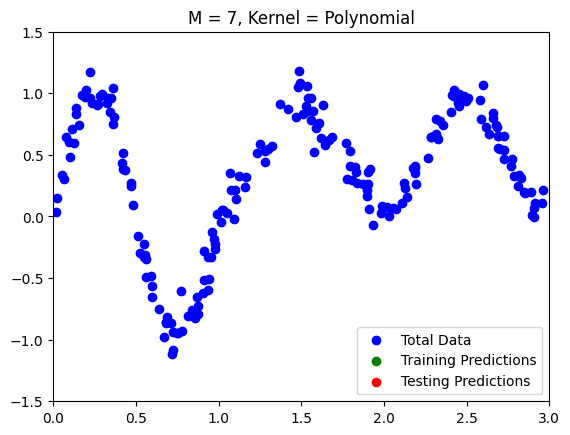

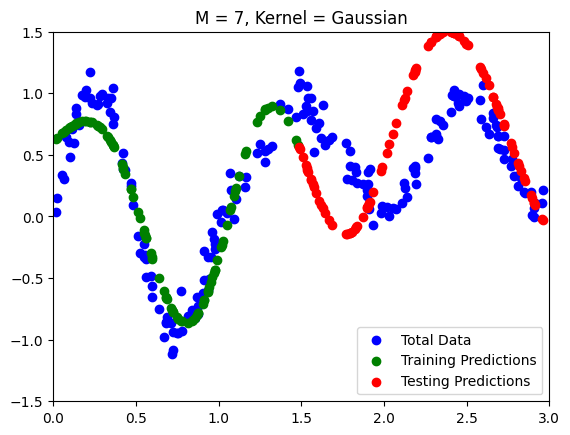

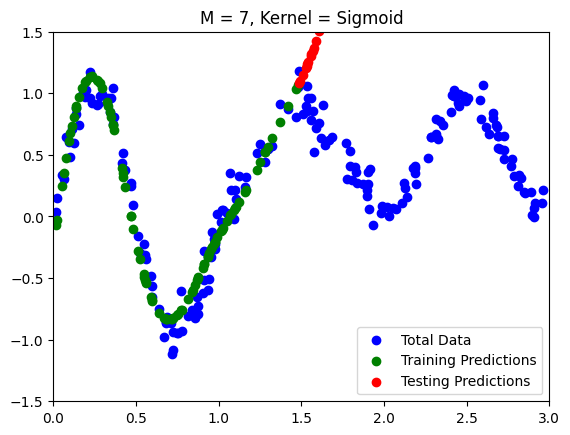

/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:127: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-4-21aa1b201a8a>:34: RuntimeWarning: overflow encountered in square
  TestError = np.sqrt(np.mean((Y_test - (X_te @ w_est)) ** 2)) + (lamda / 2) * np.linalg.norm(w_est)
<ipython-input-4-21aa1b201a8a>:33: RuntimeWarning: overflow encountered in square
  TrainError = np.sqrt(np.mean((Y_train - (X_tr @ w_est)) ** 2)) + (lamda / 2) * np.linalg.norm(w_est)
<ipython-input-4-21aa1b201a8a>:34: RuntimeWarning: overflow encountered in matmul
  TestError = np.sqrt(np.mean((Y_test - (X_te @ w_est)) ** 2)) + (lamda / 2) * np.linalg.norm(w_est)
<ipython-input-4-21aa1b201a8a>:79: RuntimeWarning: overflow encountered in matmul
  gradient = -(x_tr.T @ error).flatten() + lamda * weights
<ipython-input-4-21aa1b201a8a>:80: RuntimeWarning: invalid value encountered in subtract
  weights -= stepSize * gradient


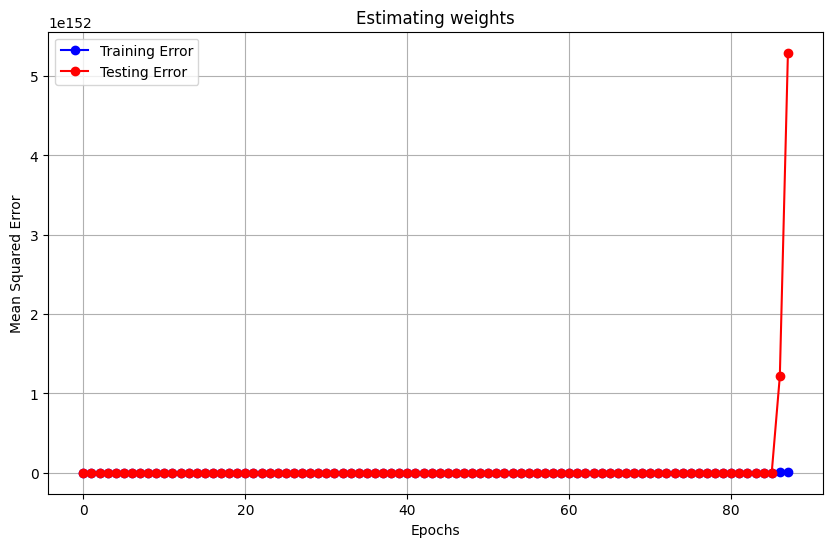

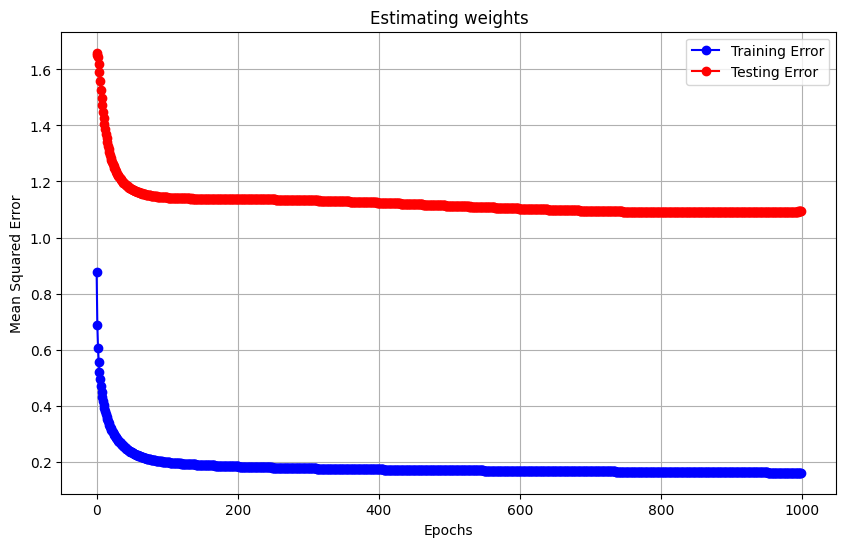

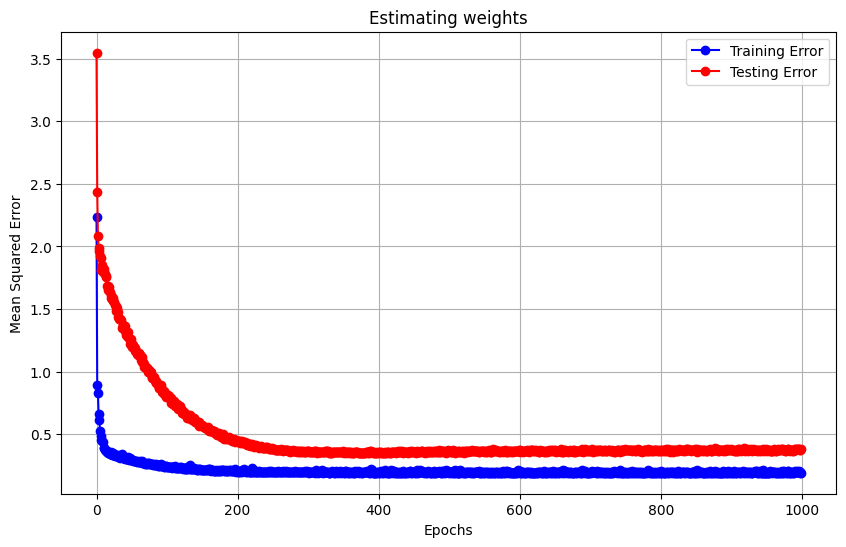

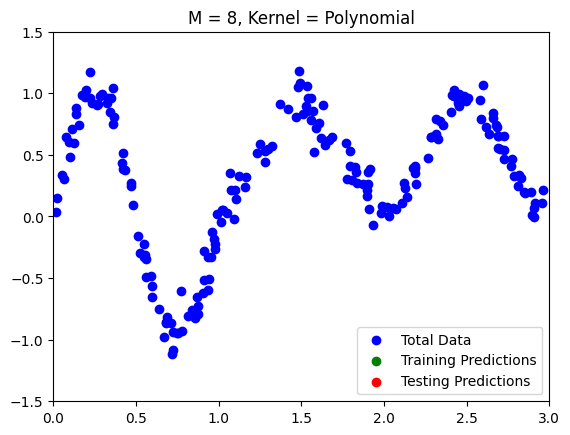

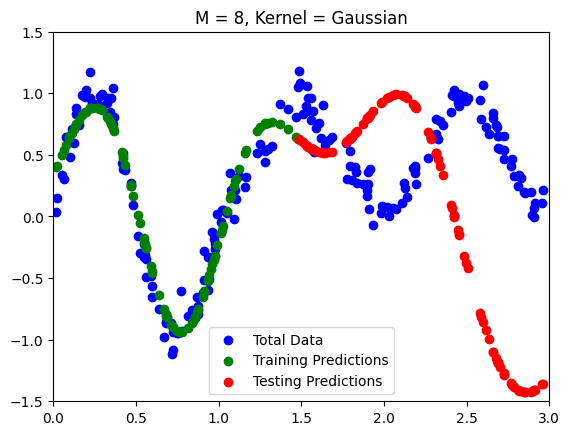

...

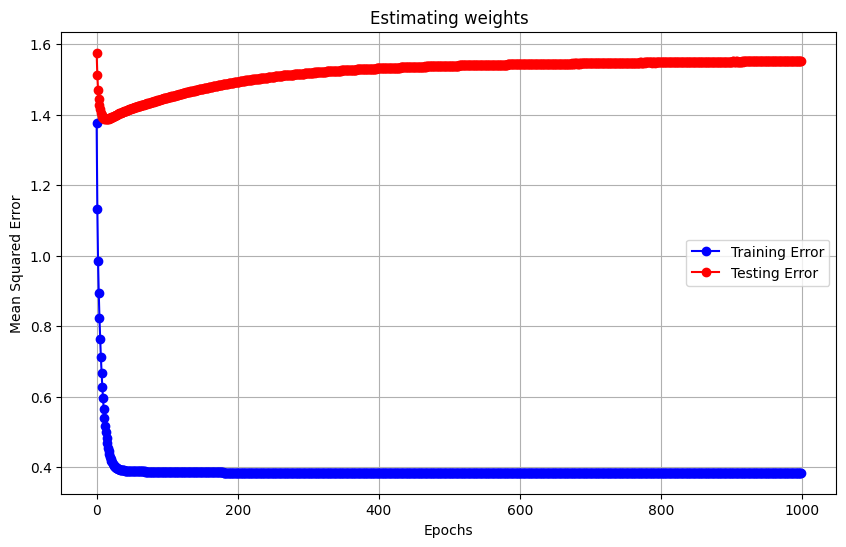

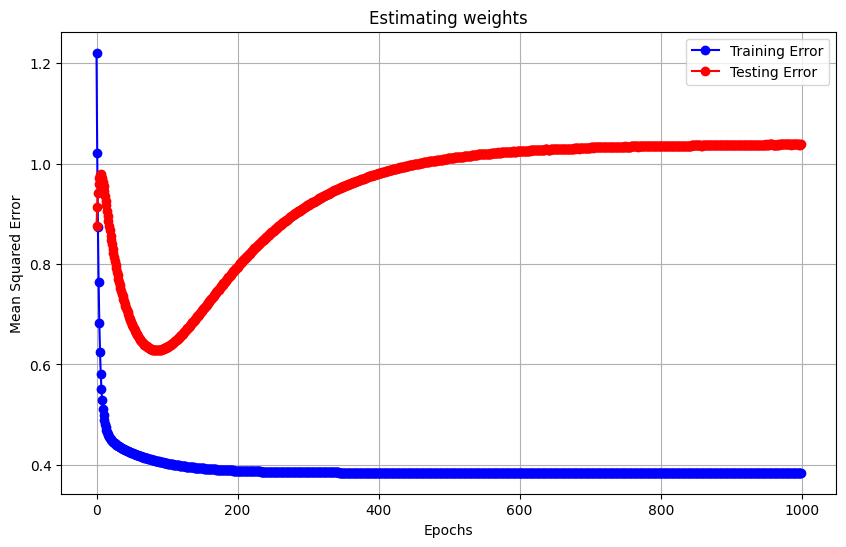

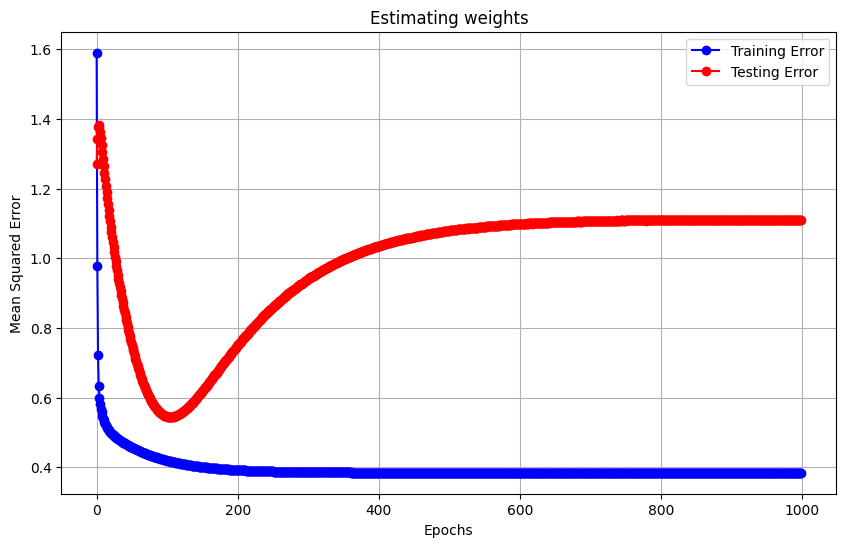

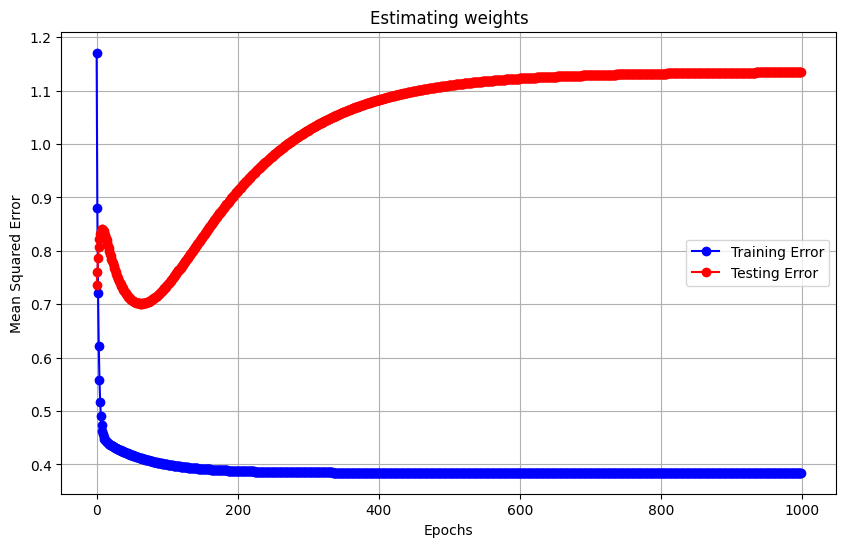

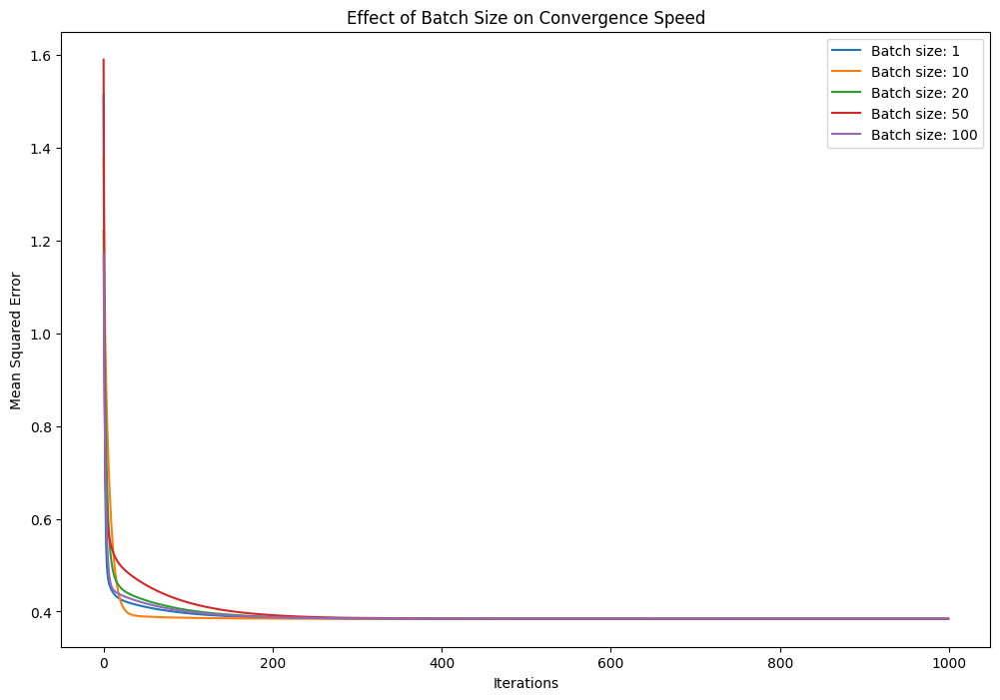

In [ ]:
#Understanding online training
########################################
#Repeat 3(a) and 3(b) using stochastic gradient descent for weight update ( plot required results )
########################################

def poly_kernel(X_train, M):
    return np.column_stack([X_train ** i for i in range(M+1)])

def gaussian_kernel(X, M, st, end):
    means = np.linspace(st,end, M+1).reshape(-1, 1)
    var = 0.1
    return np.exp(-((X.reshape(-1,1) - means.T) ** 2) / (2 * var))

def sigmoid_kernel(X_train, M, st, end ):
    means = np.linspace(st,end, M+1).reshape(-1, 1)
    return np.tanh((X_train.reshape(-1,1) - means.T) / 0.2)

def get_kernel(X, kernelType, M, st, end):
    if kernelType == 'polynomial':
        return poly_kernel(X, M)
    elif kernelType == 'gaussian':
        return gaussian_kernel(X, M, st, end)
    elif kernelType == 'sigmoidal':
        return sigmoid_kernel(X, M, st, end)


def ErrorPred(w_est,X_train,Y_train,X_test,Y_test,kernelType,lamda,st,end): #(estimated weight, training data, training targets, testing data, testing targets, type of the kernel )
    #kernelType : {Polynomial,Gaussian,Sigmoid}

    X_tr = get_kernel(X_train, kernelType, len(w_est)-1, st, end)
    X_te = get_kernel(X_test, kernelType, len(w_est)-1, st, end)

    TrainError = np.sqrt(np.mean((Y_train - (X_tr @ w_est)) ** 2)) + (lamda / 2) * np.linalg.norm(w_est)
    TestError = np.sqrt(np.mean((Y_test - (X_te @ w_est)) ** 2)) + (lamda / 2) * np.linalg.norm(w_est)

    return TrainError, TestError

def error_pred_batch(w_est, X_batch, Y_batch, kernelType, M, st=0, end=1):
    X_tr = get_kernel(X_batch, kernelType, M, st, end)
    Y_pred = X_tr @ w_est
    return Y_batch - Y_pred


def OnlineTraining(X_train, Y_train, X_test, Y_test, kernelType, M, Epochs, BatchSize, stepSize, lamda=1e-6, st=0,end=1): #(training data, training targets, testing data, testing targets, tupe of the kernel, order of the mode, Number of epochs, Batch size, Step size)
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    #Initialize the weights
    weights = np.random.randn(M+1)

    #Initialize the necessary variables
    #Iterate through epochs
    batches = len(X_train) // BatchSize
    train_errors = []
    test_errors = []
    weight_norms = []

    epochs = range(Epochs)
    for epoch in epochs:
        #Compute the train and test errors using the current weights
        tr_err, te_err = ErrorPred(weights, X_train, Y_train, X_test, Y_test, kernelType, lamda, st,end)
        #Store training and testing errors for plotting
        train_errors.append(tr_err)
        test_errors.append(te_err)
        weight_norms.append(np.linalg.norm(weights))

        #Shuffle the data
        perm = np.random.permutation(len(X_train))
        X_train_shuff, Y_train_shuff = X_train[perm], Y_train[perm]

        #Iterate through the batches
        for batch in range(batches):
            #Initialize the necessary variables
            #Get a batch of data
            x_batch = X_train_shuff[batch * BatchSize : (batch + 1) * BatchSize]
            y_batch = Y_train_shuff[batch * BatchSize : (batch + 1) * BatchSize]

            x_tr = get_kernel(x_batch, kernelType, M, st, end)
            error = error_pred_batch(weights, x_batch, y_batch, kernelType, M, st, end)

            gradient = -(x_tr.T @ error).flatten() + lamda * weights
            weights -= stepSize * gradient

    #Plot training and testing error across the epochs
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_errors, 'bo-', label='Training Error')
    plt.plot(epochs, test_errors, 'ro-', label='Testing Error')
    plt.xlabel('Epochs')
    plt.ylabel('Mean Squared Error')
    plt.title('Estimating weights')
    plt.legend()
    plt.grid()
    plt.show()

    #Return the estimated weights
    return weights, train_errors, test_errors, weight_norms


def OnlinePred(w_est,X_train,X_test,kernelType, st=0, end=1): #(estimated weights, training data, testing data, type of the kernel )
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    #Initialize the required variables
    X_tr = []
    X_te = []

    #Obtain kernel representations
    if kernelType=='polynomial':
        X_tr = get_kernel(X_train, kernelType, len(w_est)-1, st, end)
        X_te = get_kernel(X_test, kernelType, len(w_est)-1, st, end)

    if kernelType=='gaussian':
        X_tr = get_kernel(X_train, kernelType, len(w_est) - 1, st, end)
        X_te = get_kernel(X_test, kernelType, len(w_est) - 1, st, end)

    if kernelType=='sigmoidal':
        X_tr = get_kernel(X_train, kernelType, len(w_est) - 1, st, end)
        X_te = get_kernel(X_test, kernelType, len(w_est) - 1, st, end)

    #Compute and return the training and testing target estimates
    y_tr_pred = X_tr @ w_est
    y_te_pred = X_te @ w_est

    return y_tr_pred,y_te_pred

def OnlinePred_Error(w_est,X_train,Y_train,X_test,Y_test,kernelType, lamda=1e-6, st=0, end=1): #(estimated weights, training data, training targets, testing data, testing targets, type of the kernel )
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    #Initialize the required variables
    y_tr_error = []
    y_te_error = []

    #Obtain kernel representations
    # if kernelType=='polynomial':
    #     X_tr = get_kernel(X_train, kernelType, len(w_est)-1)
    #     X_te = get_kernel(X_test, kernelType, len(w_est)-1)

    # if kernelType=='gaussian':
    #     X_tr = get_kernel(X_train, kernelType, len(w_est), st, end)
    #     X_te = get_kernel(X_test, kernelType, len(w_est), st, end)

    # if kernelType=='sigmoidal':
    #     X_tr = get_kernel(X_train, kernelType, len(w_est), st, end)
    #     X_te = get_kernel(X_test, kernelType, len(w_est), st, end)

    #Compute and return the training and testing errors
    w_est, _,_,_ = OnlineTraining(X_train, Y_train, X_test, Y_test, kernelType, len(w_est)-1, 1000, 10, 0.01, 0, st, end)

    y_tr_pred, y_te_pred = OnlinePred(w_est, X_train, X_test, kernelType)
    y_tr_error = np.sqrt(np.mean((Y_train - y_tr_pred) ** 2)) + (0.5 * lamda) * np.linalg.norm(w_est)
    y_te_error = np.sqrt(np.mean((Y_test - y_te_pred) ** 2)) + (0.5 * lamda) * np.linalg.norm(w_est)

    return y_tr_error,y_te_error



##################################################
#Repeat 3a with online training
##################################################
x = np.random.uniform(0,1,100)
x = np.sort(x)
t = np.sin(2 * np.pi * x) + np.random.normal(0,0.1,100)
M_range = range(10)

x_train = x[::2]
x_test = x[1::2]
t_train = t[::2]
t_test = t[1::2]

polynomial_tr_error = []
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error = []
sigmoid_te_error = []

for i,m in enumerate(M_range):
    # for polynomial
    weights,_,_,_ = OnlineTraining(x_train, t_train, x_test, t_test, 'polynomial', m, 1000, 10, 0.01, 1e-5)
    poly_train_pred, poly_test_pred = OnlinePred(weights, x_train, x_test, 'polynomial')

    tr_error, te_error = ErrorPred(weights, x_train, t_train, x_test, t_test, 'polynomial', 1e-5, 0, 1)
    polynomial_tr_error.append(tr_error)
    polynomial_te_error.append(te_error)

    # for gaussian
    weights,_,_,_ = OnlineTraining(x_train, t_train, x_test, t_test, 'gaussian', m, 1000, 10, 0.01, 1e-5)
    gauss_train_pred, gauss_test_pred = OnlinePred(weights, x_train, x_test, 'gaussian')

    tr_error, te_error = ErrorPred(weights, x_train, t_train, x_test, t_test, 'gaussian', 1e-5, 0,1)
    gaussian_tr_error.append(tr_error)
    gaussian_te_error.append(te_error)

    # for sigmoid

    weights,_,_,_ = OnlineTraining(x_train, t_train, x_test, t_test, 'sigmoidal', m, 1000, 10, 0.01, 1e-5)
    sig_train_pred, sig_test_pred = OnlinePred(weights, x_train, x_test, 'sigmoidal', 0, 1)

    tr_error, te_error = ErrorPred(weights, x_train, t_train, x_test, t_test, 'sigmoidal', 1e-5, 0, 1)
    sigmoid_tr_error.append(tr_error)
    sigmoid_te_error.append(te_error)

    plt.scatter(x, t, color='blue', label='Total Data')
    plt.scatter(x_train, poly_train_pred, color='green', label="Training Predictions")
    plt.scatter(x_test, poly_test_pred, color='red', label='Testing Predictions')
    plt.title(f'M = {m}, Kernel = Polynomial')
    plt.xlim(0,1)
    plt.ylim(-1.5,1.5)
    plt.legend()
    plt.show()

    plt.scatter(x, t, color='blue', label='Total Data')
    plt.scatter(x_train, gauss_train_pred, color='green', label="Training Predictions")
    plt.scatter(x_test, gauss_test_pred, color='red', label='Testing Predictions')
    plt.title(f'M = {m}, Kernel = Gaussian')
    plt.xlim(0,1)
    plt.ylim(-1.5,1.5)
    plt.legend()
    plt.show()

    plt.scatter(x, t, color='blue', label='Total Data')
    plt.scatter(x_train, sig_train_pred, color='green', label="Training Predictions")
    plt.scatter(x_test, sig_test_pred, color='red', label='Testing Predictions')
    plt.title(f'M = {m}, Kernel = Sigmoid')
    plt.xlim(0,1)
    plt.ylim(-1.5,1.5)
    plt.legend()
    plt.show()


#Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels
plt.figure(figsize=(10, 6))

# Training errors
plt.plot(M_range, polynomial_tr_error, 'bo-', label='Polynomial Kernel')
plt.plot(M_range, gaussian_tr_error, 'go-', label='Gaussian Kernel')
plt.plot(M_range, sigmoid_tr_error, 'mo-', label='Sigmoidal Kernel')

plt.xlabel('Polynomial Order (M)')
plt.ylabel('Mean Squared Error')
plt.title('Training Error vs Polynomial Order')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(10, 6))

# Testing errors
plt.plot(M_range, polynomial_te_error, 'r^-', label='Polynomial Kernel')
plt.plot(M_range, gaussian_te_error, 'g^-', label='Gaussian Kernel')
plt.plot(M_range, sigmoid_te_error, 'm^-', label='Sigmoidal Kernel')

plt.xlabel('Polynomial Order (M)')
plt.ylabel('Mean Squared Error')
plt.title('Testing Error vs Polynomial Order')
plt.legend()
plt.grid()
plt.show()


##################################################
#Repeat 3b with online training
##################################################
def triangle_wave(x):
    return 2 * np.abs((x - 1.5) % 1 - 0.5) - 1

def gaussian_function(x):
    return np.exp(-((x - 2.5) ** 2) / 0.1)

# Generate data
np.random.seed(42)
x = np.random.uniform(0, 3, 200)
x = np.sort(x)
noise = np.random.normal(0, 0.1, 200)

mask1 = x < 1
mask2 = (x >= 1) & (x < 2)
mask3 = x >= 2

sin_end = np.sin(2 * np.pi * 1)
triangle_shifted = triangle_wave(x) - triangle_wave(1) + sin_end  # Shift to start from sin_end

tri_end = triangle_shifted[np.where(x >= 2)[0][0]]
gaussian_shifted = gaussian_function(x) - gaussian_function(2) + tri_end  # Shift to start from tri_end

# Construct the target function
t = np.zeros_like(x)
t[mask1] = np.sin(2 * np.pi * x[mask1]) + noise[mask1]
t[mask2] = triangle_shifted[mask2] + noise[mask2]
t[mask3] = gaussian_shifted[mask3] + noise[mask3]

x_train = x[:100]
x_test = x[100:]
t_train = t[:100]
t_test = t[100:]

M_range=list(range(10))

polynomial_tr_error = []
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error = []
sigmoid_te_error = []

for i,m in enumerate(M_range):
    weights,_,_,_ = OnlineTraining(x_train, t_train, x_test, t_test, 'polynomial', m, 1000, 10, 0.01, 1e-5, 0, 3)
    poly_train_pred, poly_test_pred = OnlinePred(weights, x_train, x_test, 'polynomial', 0, 3)

    tr_error, te_error = ErrorPred(weights, x_train, t_train, x_test, t_test, 'polynomial', 1e-5, 0, 3)
    polynomial_tr_error.append(tr_error)
    polynomial_te_error.append(te_error)

    # for gaussian
    weights,_,_,_ = OnlineTraining(x_train, t_train, x_test, t_test, 'gaussian', m, 1000, 10, 0.01, 1e-5, 0, 3)
    gauss_train_pred, gauss_test_pred = OnlinePred(weights, x_train, x_test, 'gaussian', 0, 3)

    tr_error, te_error = ErrorPred(weights, x_train, t_train, x_test, t_test, 'gaussian', 1e-5, 0, 3)
    gaussian_tr_error.append(tr_error)
    gaussian_te_error.append(te_error)

    # for sigmoid

    weights,_,_,_ = OnlineTraining(x_train, t_train, x_test, t_test, 'sigmoidal', m, 1000, 10, 0.01, 1e-5, 0, 3)
    sig_train_pred, sig_test_pred = OnlinePred(weights, x_train, x_test, 'sigmoidal', 0, 3)

    tr_error, te_error = ErrorPred(weights, x_train, t_train, x_test, t_test, 'sigmoidal', 1e-5, 0, 3)
    sigmoid_tr_error.append(tr_error)
    sigmoid_te_error.append(te_error)

    plt.scatter(x, t, color='blue', label='Total Data')
    plt.scatter(x_train, poly_train_pred, color='green', label="Training Predictions")
    plt.scatter(x_test, poly_test_pred, color='red', label='Testing Predictions')
    plt.title(f'M = {m}, Kernel = Polynomial')
    plt.xlim(0,3)
    plt.ylim(-1.5,1.5)
    plt.legend()
    plt.show()

    plt.scatter(x, t, color='blue', label='Total Data')
    plt.scatter(x_train, gauss_train_pred, color='green', label="Training Predictions")
    plt.scatter(x_test, gauss_test_pred, color='red', label='Testing Predictions')
    plt.title(f'M = {m}, Kernel = Gaussian')
    plt.xlim(0,3)
    plt.ylim(-1.5,1.5)
    plt.legend()
    plt.show()

    plt.scatter(x, t, color='blue', label='Total Data')
    plt.scatter(x_train, sig_train_pred, color='green', label="Training Predictions")
    plt.scatter(x_test, sig_test_pred, color='red', label='Testing Predictions')
    plt.title(f'M = {m}, Kernel = Sigmoid')
    plt.xlim(0,3)
    plt.ylim(-1.5,1.5)
    plt.legend()
    plt.show()


#Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels
plt.figure(figsize=(10, 6))

# Training errors
plt.plot(M_range, polynomial_tr_error, 'bo-', label='Polynomial Kernel')
plt.plot(M_range, gaussian_tr_error, 'go-', label='Gaussian Kernel')
plt.plot(M_range, sigmoid_tr_error, 'mo-', label='Sigmoidal Kernel')

plt.xlabel('Polynomial Order (M)')
plt.ylabel('Mean Squared Error')
plt.title('Training Error vs Polynomial Order')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(10, 6))

# Testing errors
plt.plot(M_range, polynomial_te_error, 'r^-', label='Polynomial Kernel')
plt.plot(M_range, gaussian_te_error, 'g^-', label='Gaussian Kernel')
plt.plot(M_range, sigmoid_te_error, 'm^-', label='Sigmoidal Kernel')

plt.xlabel('Polynomial Order (M)')
plt.ylabel('Mean Squared Error')
plt.title('Testing Error vs Polynomial Order')
plt.legend()
plt.grid()
plt.show()


########################################
#Study the effect of stepSize on the convergence of weights ( plot required results )
########################################
def study_step_size(X_train, Y_train, X_test, Y_test, kernelType, M, Epochs, BatchSize, step_sizes):
    results = []
    for step_size in step_sizes:
        _, train_errors, test_errors, weight_norms = OnlineTraining(X_train, Y_train, X_test, Y_test, kernelType, M, Epochs, BatchSize, step_size, 1e-5, 0, 3)
        results.append((step_size, train_errors, test_errors, weight_norms))
    return results

# Study effect of step size
step_sizes = [0.001, 0.01, 0.1]
step_size_results = study_step_size(x_train, t_train, x_test, t_test, 'gaussian', 5, 1000, 10, step_sizes)

plt.figure(figsize=(12, 8))
for step_size, train_errors, _, _ in step_size_results:
    plt.semilogy(train_errors, label=f'Step size: {step_size}')
plt.xlabel('Iterations')
plt.ylabel('Mean Squared Error (log scale)')
plt.title('Effect of Step Size on Convergence')
plt.legend()
plt.ylim(bottom=1e-6, top=1e2)
plt.show()

########################################
#Study the effect of batchsize on the speed of convergence ( plot required results )
########################################
def study_batch_size(X_train, Y_train, X_test, Y_test, kernelType, M, Epochs, batch_sizes, stepSize):
    results = []
    for batch_size in batch_sizes:
        _, train_errors, test_errors, weight_norms = OnlineTraining(X_train, Y_train, X_test, Y_test, kernelType, M, Epochs, batch_size, stepSize, 1e-5, 0, 3)
        results.append((batch_size, train_errors, test_errors, weight_norms))
    return results


# Study effect of batch size
batch_sizes = [1, 10, 20, 50, 100]
batch_size_results = study_batch_size(x_train, t_train, x_test, t_test, 'gaussian', 5, 1000, batch_sizes, 0.01)

plt.figure(figsize=(12, 8))
for batch_size, train_errors, _, _ in batch_size_results:
    plt.plot(train_errors, label=f'Batch size: {batch_size}')
plt.xlabel('Iterations')
plt.ylabel('Mean Squared Error')
plt.title('Effect of Batch Size on Convergence Speed')
plt.legend()
plt.show()


plt.close("all")


<b> Report your observations </b>

1. Smaller step size leads to slower convergence, larger step size leads to faster convergence

2. Larger batch size converges slowly but updates the gradient smoothly, smaller batch size converges fast but gradient is too noisy.

3. Variation in kernels shows variation in convergence of weights.

4. As M increases, the train error usually decreases but the test error increases for polyniomial due to overfitting.

5. Polynomial kernel is able to fit the data well as compared to gaussian and sigmoidal kernel.



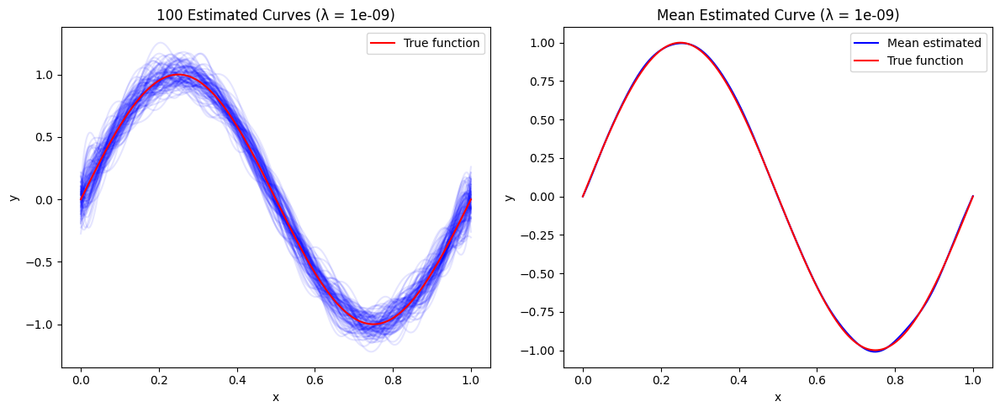

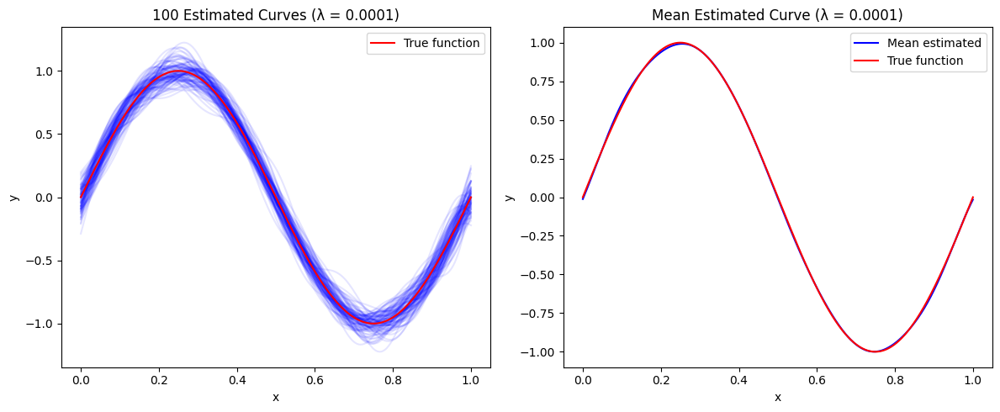

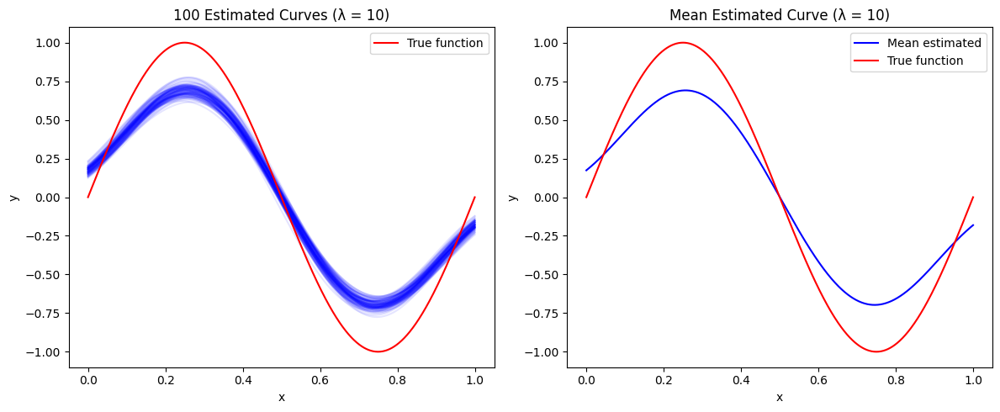

In [ ]:
#Understanding the bias-variance trade-off
########################################
#Generate 100 data sets of noisy sinusoidal data
########################################

import numpy as np
import matplotlib.pyplot as plt

np.random.seed(42)

L = 100
N = 25
M = 25

def sinusoid(x):
    return np.sin(2 * np.pi * x)

def gen_data():
    x = np.linspace(0, 1, N)
    y = sinusoid(x) + np.random.normal(0, 0.1, N)
    return x, y

def transform(x, mu, sigma):
    return np.exp(-0.5 * ((x - mu) / sigma) ** 2)

def create_design_matrix(x):
    X = np.ones((len(x), M))
    means = np.linspace(0, 1, M-1)
    sigma = 0.1
    for i in range(1, M):
        X[:, i] = transform(x, means[i-1], sigma)
    return X

def fit_model(X, y, lambda_):
    return np.linalg.inv(X.T @ X + lambda_ * np.eye(M)) @ X.T @ y

########################################
#Use regularized least squares to estimate w
########################################

########################################
#Illustrate the concept of Bias-Variance trade off
########################################
#1. Chose three different regularization coefficeints (low,middle and high)
#2. For every regularization coefficient, produce two plots: one displaying 100 estimated curves, and the other showing the mean of the estimated curves alongside the original function.
#3. For three regularization coefficients, you should have a total of six plots, meaning two plots for each regularization.
#4. Using the six plots above, describe the bias-variance trade-off.

lambda_values = [1e-9, 1e-4, 10]
for lambda_ in lambda_values:
    x_true = np.linspace(0, 1, 1000)
    y_true = sinusoid(x_true)

    estimated_curves = []
    for _ in range(L):
        x, y = gen_data()
        X = create_design_matrix(x)
        w = fit_model(X, y, lambda_)
        X_true = create_design_matrix(x_true)
        y_est = X_true @ w
        estimated_curves.append(y_est)

    estimated_curves = np.array(estimated_curves)
    mean_curve = np.mean(estimated_curves, axis=0)

    # Plot 100 estimated curves
    plt.figure(figsize=(12, 5))
    plt.subplot(121)
    for curve in estimated_curves:
        plt.plot(x_true, curve, alpha=0.1, color='blue')
    plt.plot(x_true, y_true, 'r', label='True function')
    plt.title(f'100 Estimated Curves (λ = {lambda_})')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.legend()

    # Plot mean estimated curve
    plt.subplot(122)
    plt.plot(x_true, mean_curve, 'b', label='Mean estimated')
    plt.plot(x_true, y_true, 'r', label='True function')
    plt.title(f'Mean Estimated Curve (λ = {lambda_})')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.legend()

    plt.tight_layout()
    plt.show()



<b> Report your observations </b>

1. The estimated curves and the mean of the estimated curves is very close to the true curve when the regularization coefficient is low or moderate.

2. With high regularization coefficient, the model does not try to fit the curve because a lot of importance is given to regularizing.

3. As the regularization coefficient increases, we see that the variance in the data decreases.

4. As the regularization coefficient increases, we see that the model starts to underfit the data, implying that bias increases.



In [ ]:
#Understanding MAP estimate
########################################
#Generate 100 data sets of noisy sinusoidal data
########################################
np.random.seed(99)
x = np.random.uniform(0, 1, 100)
x = np.sort(x)
e = np.random.normal(0, 0.1, 100)
t = np.sin(2*(np.pi)*x) + e

########################################
#Update the statistics of posterior density
########################################
#Initialie the parameters for standard normal prior
M = 20 # order of the model
beta = 1 # noise precision
alpha = 1 # prior precision
s_0 = np.linalg.inv(alpha * np.identity(M+1))
m_0 = np.zeros((M+1, 1))

def gaussian_kernel(X, M):
  num_samples = X.shape[0]
  kernel = np.ones((num_samples, 1))
  means = np.linspace(-1, 1, M)
  X, M_mesh = np.meshgrid(X, means)
  temp = np.exp(-1 * ((X - M_mesh) ** 2) / (2 * (0.1)))
  kernel = np.hstack((kernel, temp.T))

  return kernel

#Iterate through the data points and update the stats of posterior density
s_n = s_0
m_n = m_0

for i in range(1, 100):
  #Obtain the kernel representation
  X_tr = gaussian_kernel(np.array([x[i]]), M)

  #Update the posterior stats
  s_prev = s_n
  s_n = np.linalg.inv(np.linalg.inv(s_n) + beta * (X_tr.T @ X_tr))
  m_n = s_n @ (np.linalg.inv(s_prev) @ m_n + beta * t[i] * X_tr.T)

########################################
#Sample weight vector from posterior distribution. Estimate the curve, repeat the procedure for 100 times and get the avg fit
########################################
m_n = np.reshape(m_n, (M+1,))

x = np.linspace(0, 1, 100)
y_true = np.sin(2*(np.pi)*x)
Y = []

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Plot the hundred curves
for i in range(100):
  w = np.random.multivariate_normal(m_n, s_n)
  y = np.dot(gaussian_kernel(x, M), w)
  Y.append(y)
  axs[0].plot(x, y, color='blue', alpha=0.1)

axs[0].set_xlim(0, 1)
axs[0].set_ylim(-1.2, 1.2)
axs[0].set_xlabel('x')
axs[0].set_ylabel('f(x)')
axs[0].set_title('Hundred Estimated Curves')
axs[0].grid()

# Plot the average curve
y_average = np.sum(Y, axis=0) / 100
axs[1].plot(x, y_average, label='Average Prediction', color='red')
axs[1].plot(x, y_true, label='Original Function', color='green')
axs[1].set_xlim(0, 1)
axs[1].set_ylim(-1.2, 1.2)
axs[1].set_xlabel('x')
axs[1].set_ylabel('f(x)')
axs[1].set_title('Average Estimated Curve')
axs[1].legend(loc='upper right')
axs[1].grid()

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.suptitle('Predictions for Gaussian Kernel Regression with MAP Bayesian Updates')
plt.show()

########################################
#Predictive distribution analysis
########################################
#Predictive distribution analysis through sampling
#Iterate through data points and sample weight vectors when partial data points are seen, and plot the curves
s_n = s_0
m_n = m_0

# Define the number of data points to be used for each plot
data_points_list = [0, 20, 40, 60, 80, 100]

perm = np.random.permutation(len(x))
x_shuffled = x[perm]
t_shuffled = t[perm]

fig, axs = plt.subplots(2, 3, figsize=(18, 12))

for idx, num_points in enumerate(data_points_list):
  row = idx // 3
  col = idx % 3

  s_n = s_0
  m_n = m_0

  for i in range(num_points):
    X_tr = gaussian_kernel(np.array([x_shuffled[i]]), M)

    s_prev = s_n
    s_n = np.linalg.inv(np.linalg.inv(s_n) + beta * (X_tr.T @ X_tr))
    m_n = s_n @ (np.linalg.inv(s_prev) @ m_n + beta * t_shuffled[i] * X_tr.T)

  # Sample weight vectors from the posterior distribution and plot the curves
  for _ in range(8):
    w = np.random.multivariate_normal(m_n.flatten(), s_n)
    y_pred = np.dot(gaussian_kernel(x, M), w)
    axs[row, col].plot(x, y_pred, color='blue', alpha=0.5)
  axs[row, col].plot([], [], label='Predicted Curves', color='blue', alpha=0.5)

  # Plot the data points seen till now
  axs[row, col].scatter(x_shuffled[:num_points], t_shuffled[:num_points], color='red', label='Data Points')

  axs[row, col].set_xlim(0, 1)
  axs[row, col].set_ylim(-1.5, 1.5)
  axs[row, col].set_xlabel('x')
  axs[row, col].set_ylabel('f(x)')
  axs[row, col].set_title(f'Predictions with {num_points} Data Points')
  axs[row, col].legend(loc='upper right')
  axs[row, col].grid()

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.subplots_adjust(top=0.93)
plt.suptitle('Predictions Sampled from Current Posterior Distribution', y=0.98)
plt.show()

#Predictive distribution analysis through variance
#Iterate through data points and obtain necessary plots as discussed in the class
# Define data sizes for each plot
num_data_points = [1, 2, 4, 10, 50, 100]

# Shuffle the data points
perm = np.random.permutation(len(x))
x_shuffled = x[perm]
t_shuffled = t[perm]

fig, axs = plt.subplots(2, 3, figsize=(18, 12))

for idx, num_points in enumerate(num_data_points):
    row = idx // 3
    col = idx % 3

    s_n = s_0
    m_n = m_0

    for i in range(num_points):
        X_tr = gaussian_kernel(np.array([x_shuffled[i]]), M)
        s_prev = s_n
        s_n = np.linalg.inv(np.linalg.inv(s_n) + beta * (X_tr.T @ X_tr))
        m_n = s_n @ (np.linalg.inv(s_prev) @ m_n + beta * t_shuffled[i] * X_tr.T)

    sampled_curves = []
    for _ in range(25):
        w = np.random.multivariate_normal(m_n.flatten(), s_n)
        y_pred = np.dot(gaussian_kernel(x, M), w)
        sampled_curves.append(y_pred)

    sampled_curves = np.array(sampled_curves)
    y_mean = np.mean(sampled_curves, axis=0)
    y_std = np.std(sampled_curves, axis=0)

    # Plot the average curve and the one-deviation region
    axs[row, col].plot(x, y_mean, label='Avg Prediction', color='blue')
    axs[row, col].fill_between(x, y_mean - y_std, y_mean + y_std, color='blue', alpha=0.2, label='±1 Std Dev')
    axs[row, col].plot(x, y_true, label='Original Function', color='red')

    # Plot the data points
    axs[row, col].scatter(x_shuffled[:num_points], t_shuffled[:num_points], color='blue', label='Data Points')

    axs[row, col].set_xlim(0, 1)
    axs[row, col].set_ylim(-1.5, 1.5)
    axs[row, col].set_xlabel('x')
    axs[row, col].set_ylabel('f(x)')
    axs[row, col].set_title(f'Avg Prediction with {num_points} Data Points')
    axs[row, col].legend(loc='upper right')
    axs[row, col].grid()

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.subplots_adjust(top=0.93)
plt.suptitle('Predictive distribution analysis through variance')
plt.show()



<b> Report your observations </b>

1. The mean curve of the estimates is quite similar to the true curve.

2. Increasing the number of data points, decreases the variance, and hence brings certainity to the confidence interval.

3. Incresing the number of datapoints leads to the posterior distribution of w to be restricted to smaller and sharper area that lies near the acutal weights. The y(x,w) of the samples start to converge near the true solution.

